## **Aplicação PoseNet**

In [16]:
import sys
sys.path.append('../../')

In [17]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import cv2 as cv
import numpy as np
from torchvision import transforms as T
import json
from pathlib import Path
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
import pandas as pd
from tqdm import tqdm
import torch.optim as optim
import optuna
import kornia
from typing import Dict, List, Tuple, Callable
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr


# Importar sua classe existente
from notebooks.playground_VC.posenet.posenet import PoseNet
from src.vfss_dataset import VFSSImageDataset
from src.data_extraction.video_frame import create_video_frame_df, load_video_frame_metadata_from_csv
from src.split_data import split_data_k_fold
from src.utils import get_corners_from_angle
from src.target.heatmap import generate_heatmap_from_points
from src.utils import plot_image_with_mask

In [18]:
# UTILS
# =======================================

def clahe(img):
    img_clahe = kornia.enhance.equalize_clahe(img, clip_limit = 5.0)#, clip_limit=20.0, grid_size=(8, 8))
    return img_clahe

def modify_input(img):
    # Padroniza tudo para o formato (batch, filtro, H, W)
    if (len(img.shape) != 4):
        img = img.unsqueeze(0) 
    
    # Modifica cada uma das imagens
    list_imgs = []
    n_batch = img.shape[0]
    for i in range(n_batch):
        img_orig = img[i][0] # (filtro, H, W)

        # Aplica CLAHE
        img_clahe = clahe(img_orig)

        # Aplica Double CLAHE
        img_double_clahe = clahe(img_clahe)

        # Stack Channels
        img_channels = torch.stack([img_orig, img_clahe, img_double_clahe])

        # Stack Batch
        list_imgs.append(img_channels)

    img_new = torch.stack(list_imgs, dim = 0)
    
    return img_new

def custom_collate_fn(batch):
    """
    batch é uma lista de tuplas: [(frame, target_dict, meta), (frame, target_dict, meta), ...]
    """
    frames = torch.stack([item[0] for item in batch])  # Empilha os inputs (frames)
    
    # Agrupa os targets por chave
    target_dicts = [item[1] for item in batch]

    batched_targets = {}
    for key in target_dicts[0].keys():
        list_aux = []
        for td in target_dicts:
            list_aux.append(td[key])
        batched_targets[key] = torch.stack(list_aux)

    # Mantém os metadados como lista
    metas = [item[2] for item in batch]

    return frames, batched_targets, metas

In [19]:
# CONFIGURAÇÕES DE TREINAMENTO
# =======================================

class TrainingConfig:
    """Centraliza configurações de treinamento"""
    def __init__(
        self,
        learning_rate: float = 3e-4,
        batch_size: int = 8,
        epochs: int = 200,
        patience: int = 5,
        checkpoint_dir: str = "./checkpoints/posenet",
        device: str = "cuda"
    ):
        self.learning_rate = learning_rate
        self.batch_size = batch_size
        self.epochs = epochs
        self.patience = patience
        self.checkpoint_dir = Path(checkpoint_dir)
        self.checkpoint_dir.mkdir(parents=True, exist_ok=True)
        self.device = device

In [20]:
# GERENCIADOR DE CHECKPOINT
# =======================================

class CheckpointManager:
    """Gerencia salvamento e carregamento de checkpoints"""
    def __init__(self, checkpoint_dir: Path, fold: int):
        self.checkpoint_dir = checkpoint_dir
        self.fold = fold
        self.best_loss = float('inf')
        
    def save_checkpoint(
        self, 
        model: nn.Module, 
        optimizer: optim.Optimizer,
        epoch: int,
        val_loss: float,
        train_loss: float,
        is_best: bool = False
    ):
        """Salva checkpoint do modelo"""
        checkpoint = {
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_loss': val_loss,
            'train_loss': train_loss,
            'fold': self.fold
        }
        
        # Salva checkpoint da última época
        last_path = self.checkpoint_dir / f"fold_{self.fold}_last.pth"
        torch.save(checkpoint, last_path)
        
        # Salva melhor modelo
        if is_best:
            best_path = self.checkpoint_dir / f"fold_{self.fold}_best.pth"
            torch.save(checkpoint, best_path)
            self.best_loss = val_loss
            print(f"✓ Melhor modelo salvo (val_loss: {val_loss:.4f})")
    
    def load_checkpoint(self, model: nn.Module, optimizer: optim.Optimizer, best: bool = True):
        """Carrega checkpoint"""
        suffix = "best" if best else "last"
        checkpoint_path = self.checkpoint_dir / f"fold_{self.fold}_{suffix}.pth"
        
        if not checkpoint_path.exists():
            print(f"Checkpoint não encontrado: {checkpoint_path}")
            return None
        
        checkpoint = torch.load(checkpoint_path)
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        
        print(f"✓ Checkpoint carregado: epoch {checkpoint['epoch']}, val_loss: {checkpoint['val_loss']:.4f}")
        return checkpoint


In [21]:
# CALCULADOR DA LOSS
# =======================================

class LossCalculator:
    """Centraliza o cálculo de perdas"""
    def __init__(self, criterion_heatmap, config: TrainingConfig):
        self.criterion_heatmap = criterion_heatmap
        self.config = config
    
    def calculate_loss(self, pred_heatmap, gt_heatmap):
        """Calcula perda combinada"""
        loss_heatmap = self.criterion_heatmap(pred_heatmap, gt_heatmap)
        
        loss_total = (
            loss_heatmap
        )
        
        return loss_total, {
            'heatmap': loss_heatmap.item(),
        }


In [22]:
# TREINA UMA EPOCA
# =======================================

def train_one_epoch(
    model: nn.Module,
    train_loader: DataLoader,
    loss_calculator: LossCalculator,
    optimizer: optim.Optimizer,
    device: str,
    modify_input_fn: Callable,
    accumulation_steps: int = 4  # Novo parâmetro
) -> Tuple[float, Dict]:
    """Treina uma época com gradient accumulation"""
    model.train()
    running_loss = 0.0
    loss_components = {'heatmap': 0.0}
    
    optimizer.zero_grad()  # Movido para fora do loop
    
    for batch_idx, (inputs, targets, _) in enumerate(tqdm(train_loader, desc="Treinando")):
        inputs = modify_input_fn(inputs).to(device)
        gt_heatmap = targets['heatmap'].to(device)
        
        pred_heatmap = model(inputs)
        
        loss_total, components = loss_calculator.calculate_loss(
           pred_heatmap, gt_heatmap
        )
        
        # Normaliza a loss pelo número de acumulações
        loss_total = loss_total / accumulation_steps
        loss_total.backward()
        
        # Só atualiza os pesos a cada N batches
        if (batch_idx + 1) % accumulation_steps == 0:
            optimizer.step()
            optimizer.zero_grad()
        
        running_loss += loss_total.item() * accumulation_steps
        for key in loss_components:
            loss_components[key] += components[key]

        # NOVO: Libera memória explicitamente
        del inputs, gt_heatmap, pred_heatmap, loss_total
        torch.cuda.empty_cache()  # Use com moderação!
    
    # Atualiza caso sobre batches no final
    if (batch_idx + 1) % accumulation_steps != 0:
        optimizer.step()
        optimizer.zero_grad()
    
    n_batches = len(train_loader)
    avg_loss = running_loss / n_batches
    avg_components = {k: v / n_batches for k, v in loss_components.items()}
    
    return avg_loss, avg_components

In [23]:
# VALIDAÇÃO
# =======================================

def validate(
    model: nn.Module,
    val_loader: DataLoader,
    loss_calculator: LossCalculator,
    device: str,
    modify_input_fn: Callable
) -> Tuple[float, Dict]:
    """Valida o modelo"""
    model.eval()
    val_loss = 0.0
    loss_components = {'heatmap': 0.0}
    
    with torch.no_grad():
        for inputs, targets, _ in val_loader:
            inputs = modify_input_fn(inputs).to(device)
            gt_heatmap = targets['heatmap'].to(device)
            
            pred_heatmap = model(inputs)
            
            loss_total, components = loss_calculator.calculate_loss(
                pred_heatmap, gt_heatmap
            )
            
            val_loss += loss_total.item()
            for key in loss_components:
                loss_components[key] += components[key]
    
    n_batches = len(val_loader)
    avg_loss = val_loss / n_batches
    avg_components = {k: v / n_batches for k, v in loss_components.items()}
    
    return avg_loss, avg_components


In [24]:
# TREINA UM FOLD
# ======================================= 

def train_one_fold(
    model: nn.Module,
    train_loader: DataLoader,
    val_loader: DataLoader,
    config: TrainingConfig,
    fold: int,
    modify_input_fn: Callable
) -> Tuple[nn.Module, List[Dict]]:
    """Treina um fold completo com early stopping e checkpoints"""
    
    model.to(config.device)
    
    # Configuração
    criterion_heatmap = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=config.learning_rate)
    
    loss_calculator = LossCalculator(criterion_heatmap, config)
    checkpoint_manager = CheckpointManager(config.checkpoint_dir, fold)
    
    # Tracking
    best_val_loss = float('inf')
    patience_counter = 0
    history = []
    
    for epoch in range(config.epochs):
        # Treino
        train_loss, train_components = train_one_epoch(
            model, train_loader, loss_calculator, optimizer, config.device, modify_input_fn
        )
        
        # Validação
        val_loss, val_components = validate(
            model, val_loader, loss_calculator, config.device, modify_input_fn
        )
        
        # Logging
        epoch_info = {
            'epoch': epoch + 1,
            'train_loss': train_loss,
            'val_loss': val_loss,
            'train_components': train_components,
            'val_components': val_components
        }
        history.append(epoch_info)
        
        print(f"Época {epoch+1}/{config.epochs}")
        print(f"  Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")
        print(f"  Heatmap: {val_components['heatmap']:.4f}, ")
        
        # Checkpoint e Early Stopping
        is_best = val_loss < best_val_loss
        checkpoint_manager.save_checkpoint(
            model, optimizer, epoch, val_loss, train_loss, is_best
        )
        
        if is_best:
            best_val_loss = val_loss
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= config.patience:
                print(f"Early stopping ativado na época {epoch+1}")
                break
    
    # Carrega melhor modelo
    checkpoint_manager.load_checkpoint(model, optimizer, best=True)
    
    return model, history

In [25]:
# VALIDAÇÃO CRUZADA
# ======================================= 

def cross_validate(
    model_class,
    folds: List[pd.DataFrame],
    config: TrainingConfig,
    target: str,
    output_dim: Tuple[int, int],
    modify_input_fn: Callable,
    dataset_class,
    collate_fn: Callable,
    model_kwargs: Dict = None
) -> Dict:
    """Executa validação cruzada K-Fold"""
    
    model_kwargs = model_kwargs or {}
    k = len(folds)
    results = {
        'fold_losses': [],
        'fold_histories': [],
        'best_fold': None,
        'best_loss': float('inf')
    }
    
    for i in range(k):
        print(f"\n{'='*50}")
        print(f"FOLD {i+1}/{k}")
        print(f"{'='*50}")
        
        # Preparação dos dados
        df_val = folds[i]
        df_train = pd.concat([folds[j] for j in range(k) if j != i], ignore_index=True)
        
        train_set = dataset_class(df_train, target, output_dim)
        val_set = dataset_class(df_val, target, output_dim)
        
        train_loader = DataLoader(
            train_set, batch_size=config.batch_size, shuffle=True, collate_fn=collate_fn
        )
        val_loader = DataLoader(
            val_set, batch_size=config.batch_size, shuffle=False, collate_fn=collate_fn
        )
        
        # Novo modelo para cada fold
        model = model_class(**model_kwargs)
        
        # Treina fold
        model, history = train_one_fold(
            model, train_loader, val_loader, config, i+1, modify_input_fn
        )
        
        # Validação final
        final_val_loss, _ = validate(
            model, val_loader, 
            LossCalculator(nn.MSELoss(), config),
            config.device, modify_input_fn
        )
        
        results['fold_losses'].append(final_val_loss)
        results['fold_histories'].append(history)
        
        # Atualiza melhor fold
        if final_val_loss < results['best_loss']:
            results['best_loss'] = final_val_loss
            results['best_fold'] = i + 1
        
        print(f"\nFold {i+1} Loss Final: {final_val_loss:.4f}")
    
    # Estatísticas finais
    results['mean_loss'] = np.mean(results['fold_losses'])
    results['std_loss'] = np.std(results['fold_losses'])
    
    print(f"\n{'='*50}")
    print(f"RESULTADOS FINAIS")
    print(f"{'='*50}")
    print(f"Média dos Folds: {results['mean_loss']:.4f} ± {results['std_loss']:.4f}")
    print(f"Melhor Fold: {results['best_fold']} (Loss: {results['best_loss']:.4f})")
    
    # Salva resultados
    results_path = config.checkpoint_dir / "cross_validation_results.json"
    with open(results_path, 'w') as f:
        json.dump({
            'fold_losses': results['fold_losses'],
            'mean_loss': results['mean_loss'],
            'std_loss': results['std_loss'],
            'best_fold': results['best_fold'],
            'best_loss': results['best_loss']
        }, f, indent=2)
    
    return results

In [26]:
# TUNAGEM DE HIPERPARÂMETROS
# ======================================= 

def objective_optuna(
    trial: optuna.Trial,
    model_class,
    folds: List[pd.DataFrame],
    target: str,
    output_dim: Tuple[int, int],
    modify_input_fn: Callable,
    dataset_class,
    collate_fn: Callable,
    device: str,
    epochs: int,
    model_kwargs: Dict = None
) -> float:
    """Função objetivo para otimização Optuna"""
    
    # Hiperparâmetros a serem otimizados
    lr = trial.suggest_float("lr", 1e-5, 1e-2, log=True)
    batch_size = trial.suggest_categorical("batch_size", [4, 8, 16, 32])
    
    # Configuração com hiperparâmetros sugeridos
    config = TrainingConfig(
        learning_rate=lr,
        batch_size=batch_size,
        epochs=epochs,  # Reduzido para Optuna
        patience=10,
        checkpoint_dir=f"./optuna_trials/trial_{trial.number}",
        device=device
    )
    
    # Executa cross-validation
    results = cross_validate(
        model_class, folds, config, target, output_dim,
        modify_input_fn, dataset_class, collate_fn, model_kwargs
    )

    # Limpa memória após cada trial
    torch.cuda.empty_cache()
    
    # Pruning - reporta loss intermediária para parar trials ruins
    # Optuna pode cancelar trials que claramente não vão dar certo
    trial.report(results['mean_loss'], step=0)
    if trial.should_prune():
        raise optuna.TrialPruned()
    
    return results['mean_loss']


def tune_hyperparameters(
    model_class,
    folds: List[pd.DataFrame],
    target: str,
    output_dim: Tuple[int, int],
    modify_input_fn: Callable,
    dataset_class,
    collate_fn: Callable,
    device: str,
    epochs: int = 50,
    n_trials: int = 20,
    model_kwargs: Dict = None
) -> optuna.Study:
    """Tunagem de hiperparâmetros com Optuna"""
    
    study = optuna.create_study(
        direction="minimize",
        study_name="posenet_hyperparameter_tuning"
    )
    
    study.optimize(
        lambda trial: objective_optuna(
            trial, model_class, folds, target, output_dim,
            modify_input_fn, dataset_class, collate_fn, device, epochs, model_kwargs
        ),
        n_trials=n_trials,
        show_progress_bar=True
    )
    
    print("\n" + "="*50)
    print("MELHORES HIPERPARÂMETROS")
    print("="*50)
    print(f"Melhor Loss: {study.best_value:.4f}")
    print("Parâmetros:")
    for key, value in study.best_params.items():
        print(f"  {key}: {value}")
    
    return study

In [27]:
# VISUALIZAÇÃO E ANÁLISE DE RESULTADOS
# ======================================= 

class TestEvaluator:
    """Avalia modelo no conjunto de teste e gera visualizações"""
    
    def __init__(
        self,
        model_class,
        model_kwargs: Dict,
        checkpoint_path: str,
        device: str,
        modify_input_fn: Callable
    ):
        self.model_class = model_class
        self.model_kwargs = model_kwargs or {}
        self.device = device
        self.modify_input_fn = modify_input_fn
        
        # Carrega modelo
        self.model = model_class(**self.model_kwargs).to(device)
        checkpoint = torch.load(checkpoint_path, map_location=device)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.model.eval()
        
        print(f"✓ Modelo carregado: {checkpoint_path}")
        print(f"  Epoch: {checkpoint.get('epoch', 'N/A')}")
        print(f"  Val Loss: {checkpoint.get('val_loss', 'N/A'):.4f}")
    
    def extract_keypoints_from_heatmap(self, heatmap: torch.Tensor) -> torch.Tensor:
        """Extrai coordenadas dos keypoints do heatmap"""
        num_keypoints = heatmap.shape[0]
        points = torch.zeros(num_keypoints, 2)
        
        for k in range(num_keypoints):
            heatmap_k = heatmap[k].cpu().numpy()
            idx = np.unravel_index(np.argmax(heatmap_k), heatmap_k.shape)
            points[k] = torch.tensor([idx[0], idx[1]])  # (y, x)
        
        return points
    
    def euclidean_distance(self, point1: torch.Tensor, point2: torch.Tensor) -> float:
        """Calcula distância euclidiana entre dois pontos"""
        return torch.sqrt(torch.sum((point1 - point2) ** 2)).item()
    
    def evaluate_test_set(
        self,
        test_dataset,
        loss_calculator: LossCalculator
    ) -> Dict:
        """Avalia modelo no conjunto de teste"""
        
        num_keypoints = self.model_kwargs['num_keypoints']
        
        results = {
            'keypoint_distances': [[] for _ in range(num_keypoints)],
            'total_losses': [],
            'predictions': [],
            'ground_truths': [],
            'images': []
        }
        
        print(f"\nAvaliando {len(test_dataset)} amostras do conjunto de teste...")
        
        for idx in tqdm(range(len(test_dataset)), desc="Avaliando"):
            input_img, target, _ = test_dataset[idx]
            
            # Preparação
            input_tensor = self.modify_input_fn(input_img).float().to(self.device)
            gt_heatmap = target['heatmap'].float().to(self.device)
            
            # Inferência
            with torch.no_grad():
                pred_heatmap = self.model(input_tensor)
            
            pred_heatmap = pred_heatmap.squeeze(0)
            
            # Extrai pontos
            gt_points = self.extract_keypoints_from_heatmap(gt_heatmap)
            pred_points = self.extract_keypoints_from_heatmap(pred_heatmap)
            
            # Calcula distâncias por keypoint
            for k in range(num_keypoints):
                dist = self.euclidean_distance(gt_points[k], pred_points[k])
                results['keypoint_distances'][k].append(dist)
            
            # Calcula losses
            loss_total, components = loss_calculator.calculate_loss(
                pred_heatmap, gt_heatmap
            )
            
            results['total_losses'].append(loss_total.item())
            
            # Armazena para visualização
            results['predictions'].append({
                'points': pred_points,
                'heatmap': pred_heatmap.cpu(),
            })
            results['ground_truths'].append({
                'points': gt_points,
                'heatmap': gt_heatmap.cpu(),
            })
            results['images'].append(input_tensor.squeeze(0).cpu())
        
        # Converte para arrays
        for k in range(num_keypoints):
            results['keypoint_distances'][k] = np.array(results['keypoint_distances'][k])
        results['total_losses'] = np.array(results['total_losses'])
        
        return results
    
    def plot_loss_distributions(
        self,
        results: Dict,
        save_path: str = None
    ):
        """Plota histogramas das distribuições de loss"""
        
        fig, ax = plt.subplots(1, 1, figsize=(14, 10))
        fig.suptitle('Distribuição das Losses no Conjunto de Teste', fontsize=16, y=1.0)
        
        # 1. Total Loss
        ax.hist(results['total_losses'], bins=30, color='lightcoral', edgecolor='black', alpha=0.7)
        ax.axvline(np.mean(results['total_losses']), color='red', linestyle='--',
                   label=f'Média: {np.mean(results["total_losses"]):.4f}')
        ax.axvline(np.median(results['total_losses']), color='green', linestyle='--',
                   label=f'Mediana: {np.median(results["total_losses"]):.4f}')
        ax.set_xlabel('Total Loss')
        ax.set_ylabel('Frequência')
        ax.set_title('Distribuição: Total Loss')
        ax.legend()
        ax.grid(alpha=0.3)
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"✓ Gráfico salvo: {save_path}")
        
        plt.show()
    
    def plot_keypoint_analysis(
        self,
        results: Dict,
        save_path: str = None
    ):
        """Plota análise detalhada por keypoint"""
        
        num_keypoints = len(results['keypoint_distances'])
        fig, axes = plt.subplots(1, num_keypoints, figsize=(6*num_keypoints, 5))
        
        if num_keypoints == 1:
            axes = [axes]
        
        fig.suptitle('Análise de Distâncias por Keypoint', fontsize=16)
        
        for k in range(num_keypoints):
            ax = axes[k]
            distances = results['keypoint_distances'][k]
            
            # Histograma
            ax.hist(distances, bins=30, color='orange', edgecolor='black', alpha=0.7)
            
            # Estatísticas
            mean_dist = np.mean(distances)
            median_dist = np.median(distances)
            std_dist = np.std(distances)
            
            ax.axvline(mean_dist, color='red', linestyle='--', linewidth=2,
                      label=f'Média: {mean_dist:.2f}px')
            ax.axvline(median_dist, color='green', linestyle='--', linewidth=2,
                      label=f'Mediana: {median_dist:.2f}px')
            
            ax.set_xlabel('Distância Euclidiana (pixels)')
            ax.set_ylabel('Frequência')
            ax.set_title(f'Keypoint {k+1}\n(Std: {std_dist:.2f}px)')
            ax.legend()
            ax.grid(alpha=0.3)
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"✓ Gráfico salvo: {save_path}")
        
        plt.show()
    
    def visualize_predictions(
        self,
        results: Dict,
        metric_type: str = 'total_loss',
        save_path: str = None
    ):
        """Visualiza melhor, mediana e pior predição por keypoint"""
        
        num_keypoints = len(results['keypoint_distances'])
        
        for k in range(num_keypoints):
            print(f"\n--- Visualizações para Keypoint {k+1} ---")
            
            # Define métrica
            if metric_type == 'distance':
                metric = results['keypoint_distances'][k]
                metric_name = "Distância Euclidiana"
            else:  # total_loss
                metric = results['total_losses']
                metric_name = "Total Loss"
            
            # Encontra índices
            idx_min = np.argmin(metric)
            idx_max = np.argmax(metric)
            idx_med = np.argsort(metric)[len(metric)//2]
            
            indices = [idx_min, idx_med, idx_max]
            values = [metric[idx_min], metric[idx_med], metric[idx_max]]
            titles = ["Melhor Caso", "Caso Mediano", "Pior Caso"]
            
            # Cria figura
            fig, axes = plt.subplots(2, 3, figsize=(15, 10))
            fig.suptitle(f'Keypoint {k+1} - Análise por {metric_name}', fontsize=16)
            
            for col, (idx, val, title) in enumerate(zip(indices, values, titles)):
                # Imagem original com pontos
                ax_img = axes[0, col]
                img = results['images'][idx][0].numpy()
                ax_img.imshow(img, cmap='gray')
                
                # Ground truth
                gt_point = results['ground_truths'][idx]['points'][k]
                ax_img.scatter(gt_point[1], gt_point[0], color='lime', marker='x', 
                              s=150, linewidths=3, label='Ground Truth')
                
                # Predição
                pred_point = results['predictions'][idx]['points'][k]
                ax_img.scatter(pred_point[1], pred_point[0], color='red', marker='o',
                              s=100, linewidths=2, label='Predição')
                
                # Linha conectando
                ax_img.plot([gt_point[1], pred_point[1]], [gt_point[0], pred_point[0]],
                           'yellow', linewidth=2, alpha=0.7)
                
                dist = self.euclidean_distance(gt_point, pred_point)
                ax_img.set_title(f'{title}\n{metric_name}: {val:.4f}\nDist: {dist:.2f}px')
                ax_img.axis('off')
                ax_img.legend(loc='upper right')
                
                # Heatmap predito
                ax_heat = axes[1, col]
                pred_heatmap = results['predictions'][idx]['heatmap'][k].numpy()
                im = ax_heat.imshow(pred_heatmap, cmap='hot')
                ax_heat.scatter(pred_point[1], pred_point[0], color='cyan', marker='o',
                               s=100, linewidths=2)
                ax_heat.set_title('Heatmap Predito')
                ax_heat.axis('off')
                plt.colorbar(im, ax=ax_heat, fraction=0.046)
            
            plt.tight_layout()
            
            if save_path:
                path_final = f"{save_path}_keypoint{k+1}.png"
                plt.savefig(path_final, dpi=300, bbox_inches='tight')
                print(f"✓ Figura salva: {path_final}")
            
            plt.show()
    
    def generate_report(self, results: Dict, save_path: str = None):
        """Gera relatório textual completo"""
        
        report = []
        report.append("="*70)
        report.append("RELATÓRIO DE AVALIAÇÃO NO CONJUNTO DE TESTE")
        report.append("="*70)
        report.append(f"\nNúmero de amostras: {len(results['total_losses'])}")
        
        # Loss Total
        report.append("\n" + "-"*70)
        report.append("LOSS TOTAL")
        report.append("-"*70)
        report.append(f"Média:    {np.mean(results['total_losses']):.6f}")
        report.append(f"Mediana:  {np.median(results['total_losses']):.6f}")
        report.append(f"Std:      {np.std(results['total_losses']):.6f}")
        report.append(f"Min:      {np.min(results['total_losses']):.6f}")
        report.append(f"Max:      {np.max(results['total_losses']):.6f}")
        
        # Por keypoint
        num_keypoints = len(results['keypoint_distances'])
        for k in range(num_keypoints):
            distances = results['keypoint_distances'][k]
            report.append("\n" + "-"*70)
            report.append(f"KEYPOINT {k+1} - DISTÂNCIA EUCLIDIANA (pixels)")
            report.append("-"*70)
            report.append(f"Média:    {np.mean(distances):.2f}")
            report.append(f"Mediana:  {np.median(distances):.2f}")
            report.append(f"Std:      {np.std(distances):.2f}")
            report.append(f"Min:      {np.min(distances):.2f}")
            report.append(f"Max:      {np.max(distances):.2f}")
            report.append(f"Quartis:  Q1={np.percentile(distances, 25):.2f}, "
                         f"Q3={np.percentile(distances, 75):.2f}")
        
        report.append("\n" + "="*70)
        
        report_text = "\n".join(report)
        print(report_text)
        
        if save_path:
            with open(save_path, 'w', encoding='utf-8') as f:
                f.write(report_text)
            print(f"\n✓ Relatório salvo: {save_path}")
        
        return report_text

In [28]:
# INFERÊNCIA
# ======================================= 

def evaluate_model_on_test(
    model_class,
    model_kwargs: Dict,
    checkpoint_path: str,
    test_dataset,
    config: TrainingConfig,
    modify_input_fn: Callable,
    output_dir: str = "./evaluation_results"
):
    """
    Pipeline completo de avaliação no conjunto de teste
    
    Args:
        model_class: Classe do modelo
        model_kwargs: Argumentos do modelo
        checkpoint_path: Caminho do checkpoint a ser avaliado
        test_dataset: Dataset de teste
        config: Configuração de treinamento
        modify_input_fn: Função para modificar input
        output_dir: Diretório para salvar resultados
    """
    
    output_path = Path(output_dir)
    output_path.mkdir(parents=True, exist_ok=True)
    
    print("\n" + "="*70)
    print("INICIANDO AVALIAÇÃO NO CONJUNTO DE TESTE")
    print("="*70)
    
    # Inicializa avaliador
    evaluator = TestEvaluator(
        model_class=model_class,
        model_kwargs=model_kwargs,
        checkpoint_path=checkpoint_path,
        device=config.device,
        modify_input_fn=modify_input_fn
    )
    
    # Avalia conjunto de teste
    loss_calculator = LossCalculator(
        criterion_heatmap=nn.MSELoss(),
        config=config
    )
    
    results = evaluator.evaluate_test_set(test_dataset, loss_calculator)
    
    # Gera visualizações
    print("\n" + "="*70)
    print("GERANDO VISUALIZAÇÕES")
    print("="*70)
    
    # 1. Distribuições de loss
    evaluator.plot_loss_distributions(
        results,
        save_path=str(output_path / "loss_distributions.png")
    )
    
    # 2. Análise por keypoint
    evaluator.plot_keypoint_analysis(
        results,
        save_path=str(output_path / "keypoint_analysis.png")
    )
    
    # 3. Visualizações de predições (por distância)
    evaluator.visualize_predictions(
        results,
        metric_type='distance',
        save_path=str(output_path / "predictions_by_distance")
    )
    
    # 4. Visualizações de predições (por total loss)
    evaluator.visualize_predictions(
        results,
        metric_type='total_loss',
        save_path=str(output_path / "predictions_by_loss")
    )
    
    # 5. Gera relatório
    evaluator.generate_report(
        results,
        save_path=str(output_path / "evaluation_report.txt")
    )
    
    print("\n" + "="*70)
    print("AVALIAÇÃO CONCLUÍDA!")
    print(f"Resultados salvos em: {output_path}")
    print("="*70)
    
    return results

In [29]:
# APLICAÇÃO - INICIALIZAÇÃO
# ======================================= 

# Configuração
config = TrainingConfig(
    learning_rate=3e-4,
    batch_size=8,
    epochs=1,
    patience=2,
    checkpoint_dir="..\\..\\data\\model_weights\\posenet",
    device="cuda" if torch.cuda.is_available() else "cpu"
)

# Parâmetros do modelo
target = "heatmap+roi+points"
output_dim = (256, 256)
model_kwargs = {
    "num_keypoints": 2,
}

# Incializando os dados para treino
videos_dir = 'C:\\Users\\vinic\\OneDrive\\Documentos\\Faculdade\\Doutorado\\Pesquisa_INCA\\vfss-data-split\\data\\videos\\' 
labels_dir = 'C:\\Users\\vinic\\OneDrive\\Documentos\\Faculdade\\Doutorado\\Pesquisa_INCA\\vfss-data-split\\data\\rotulos\\anotacoes-tecgraf\\'

video_frame_df = create_video_frame_df(
    videos_dir=videos_dir,
    labels_dir=labels_dir,
    target='points'
)

print("\nSplit Dados")
list_df_folds, df_test = split_data_k_fold(video_frame_df, test_size=0.2, n_folds=5)

# Conjunto de Teste
test_data = VFSSImageDataset(
    video_frame_df=df_test,
    target='heatmap+roi+points',
    output_dim= (256, 256),
    sigma = 20
)

Shape of attributions metadata df: (2000, 5)
Shape of label metadata df: (1361, 7)
Shape of labeled frames df: (2000, 9)

Split Dados
Folds all: 92
Test: 23
Overall Dataset - Videos: 234 | Patients: 115 | Frames: 814 (100.0%)
Training + Validation Set - Videos: 192 | Patients: 92 | Frames: 668 (82.1%)
Test Set - Videos: 42 | Patients: 23 | Frames: 146 (17.9%)

Fold 1 - Videos: 41 | Patients: 19 | Frames: 145 (17.8%)
Fold 2 - Videos: 56 | Patients: 19 | Frames: 183 (22.5%)
Fold 3 - Videos: 40 | Patients: 18 | Frames: 155 (19.0%)
Fold 4 - Videos: 26 | Patients: 18 | Frames: 95 (11.7%)
Fold 5 - Videos: 29 | Patients: 18 | Frames: 90 (11.1%)


,split_name,n_videos,n_patients,n_frames,percentage_of_initial_frames,video_ids
0,fold_1,41,19,145,0.178133,"[101, 102, 103, 104, 105, 106, 107, 108, 109, ..."
1,fold_2,56,19,183,0.224816,"[129, 130, 131, 132, 136, 137, 138, 139, 140, ..."
2,fold_3,40,18,155,0.190418,"[122, 123, 125, 126, 127, 128, 152, 153, 154, ..."
3,fold_4,26,18,95,0.116708,"[10, 113, 114, 115, 116, 117, 118, 119, 120, 1..."
4,fold_5,29,18,90,0.110565,"[192, 193, 194, 195, 196, 197, 198, 199, 200, ..."
5,test_set,42,23,146,0.179361,"[100, 11, 13, 142, 143, 144, 145, 146, 147, 14..."


In [ ]:
# APLICAÇÃO - TREINO
# ======================================= 

# Cross-validation sem tunagem
"""
results = cross_validate(
    model_class=PoseNet,
    folds=list_df_folds,
    config=config,
    target=target,
    output_dim=output_dim,
    modify_input_fn=modify_input,
    dataset_class=VFSSImageDataset,
    collate_fn=custom_collate_fn,
    model_kwargs=model_kwargs
)

"""

# Tunagem de hiperparâmetros com Optuna

study = tune_hyperparameters(
    model_class=PoseNet,
    folds=list_df_folds,
    target=target,
    output_dim=output_dim,
    modify_input_fn=modify_input,
    dataset_class=VFSSImageDataset,
    collate_fn=custom_collate_fn,
    device=config.device,
    n_trials=5,
    epochs = 5,
    model_kwargs=model_kwargs
)

# Treina com melhores hiperparâmetros
best_config = TrainingConfig(
    learning_rate=study.best_params['lr'],
    batch_size=study.best_params['batch_size'],
    epochs=25,   # Usar uma epoca maior, visto que é o melhor modelo... 
    patience=5,
    checkpoint_dir="..\\..\\data\\model_weights\\posenet_tunning",
    device=config.device
)

final_results = cross_validate(
    model_class=PoseNet,
    folds=list_df_folds,
    config=best_config,
    target=target,
    output_dim=output_dim,
    modify_input_fn=modify_input,
    dataset_class=VFSSImageDataset,
    collate_fn=custom_collate_fn,
    model_kwargs=model_kwargs
)


[I 2025-11-21 04:09:11,533] A new study created in memory with name: posenet_hyperparameter_tuning
c:\Users\vinic\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\progress_bar.py:56: ExperimentalWarning: Progress bar is experimental (supported from v1.2.0). The interface can change in the future.
  self._init_valid()


  0%|          | 0/5 [00:00<?, ?it/s]


FOLD 1/5


Treinando: 100%|██████████| 66/66 [01:49<00:00,  1.67s/it]


Época 1/5
  Train Loss: 1.5367 | Val Loss: 0.0741
  Heatmap: 0.0741, 
✓ Melhor modelo salvo (val_loss: 0.0741)


Treinando: 100%|██████████| 66/66 [01:44<00:00,  1.58s/it]


Época 2/5
  Train Loss: 0.0263 | Val Loss: 0.0197
  Heatmap: 0.0197, 
✓ Melhor modelo salvo (val_loss: 0.0197)


Treinando: 100%|██████████| 66/66 [01:48<00:00,  1.65s/it]


Época 3/5
  Train Loss: 0.0052 | Val Loss: 0.0032
  Heatmap: 0.0032, 
✓ Melhor modelo salvo (val_loss: 0.0032)


Treinando: 100%|██████████| 66/66 [01:51<00:00,  1.69s/it]


Época 4/5
  Train Loss: 0.0017 | Val Loss: 0.0008
  Heatmap: 0.0008, 
✓ Melhor modelo salvo (val_loss: 0.0008)


Treinando: 100%|██████████| 66/66 [01:45<00:00,  1.60s/it]


Época 5/5
  Train Loss: 0.0008 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)
✓ Checkpoint carregado: epoch 4, val_loss: 0.0006

Fold 1 Loss Final: 0.0006

FOLD 2/5


Treinando: 100%|██████████| 61/61 [01:34<00:00,  1.55s/it]


Época 1/5
  Train Loss: 1.3553 | Val Loss: 0.2622
  Heatmap: 0.2622, 
✓ Melhor modelo salvo (val_loss: 0.2622)


Treinando: 100%|██████████| 61/61 [01:36<00:00,  1.57s/it]


Época 2/5
  Train Loss: 0.0161 | Val Loss: 0.0069
  Heatmap: 0.0069, 
✓ Melhor modelo salvo (val_loss: 0.0069)


Treinando: 100%|██████████| 61/61 [01:35<00:00,  1.57s/it]


Época 3/5
  Train Loss: 0.0030 | Val Loss: 0.0014
  Heatmap: 0.0014, 
✓ Melhor modelo salvo (val_loss: 0.0014)


Treinando: 100%|██████████| 61/61 [01:36<00:00,  1.59s/it]


Época 4/5
  Train Loss: 0.0011 | Val Loss: 0.0009
  Heatmap: 0.0009, 
✓ Melhor modelo salvo (val_loss: 0.0009)


Treinando: 100%|██████████| 61/61 [01:38<00:00,  1.61s/it]


Época 5/5
  Train Loss: 0.0008 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)
✓ Checkpoint carregado: epoch 4, val_loss: 0.0006

Fold 2 Loss Final: 0.0006

FOLD 3/5


Treinando: 100%|██████████| 65/65 [01:43<00:00,  1.60s/it]


Época 1/5
  Train Loss: 1.4164 | Val Loss: 0.1744
  Heatmap: 0.1744, 
✓ Melhor modelo salvo (val_loss: 0.1744)


Treinando: 100%|██████████| 65/65 [01:43<00:00,  1.60s/it]


Época 2/5
  Train Loss: 0.0088 | Val Loss: 0.0036
  Heatmap: 0.0036, 
✓ Melhor modelo salvo (val_loss: 0.0036)


Treinando: 100%|██████████| 65/65 [01:43<00:00,  1.60s/it]


Época 3/5
  Train Loss: 0.0017 | Val Loss: 0.0025
  Heatmap: 0.0025, 
✓ Melhor modelo salvo (val_loss: 0.0025)


Treinando: 100%|██████████| 65/65 [01:44<00:00,  1.61s/it]


Época 4/5
  Train Loss: 0.0010 | Val Loss: 0.0014
  Heatmap: 0.0014, 
✓ Melhor modelo salvo (val_loss: 0.0014)


Treinando: 100%|██████████| 65/65 [01:43<00:00,  1.60s/it]


Época 5/5
  Train Loss: 0.0008 | Val Loss: 0.0010
  Heatmap: 0.0010, 
✓ Melhor modelo salvo (val_loss: 0.0010)
✓ Checkpoint carregado: epoch 4, val_loss: 0.0010

Fold 3 Loss Final: 0.0010

FOLD 4/5


Treinando: 100%|██████████| 72/72 [01:54<00:00,  1.59s/it]


Época 1/5
  Train Loss: 1.4089 | Val Loss: 0.0586
  Heatmap: 0.0586, 
✓ Melhor modelo salvo (val_loss: 0.0586)


Treinando: 100%|██████████| 72/72 [01:54<00:00,  1.59s/it]


Época 2/5
  Train Loss: 0.0092 | Val Loss: 0.0016
  Heatmap: 0.0016, 
✓ Melhor modelo salvo (val_loss: 0.0016)


Treinando: 100%|██████████| 72/72 [01:56<00:00,  1.62s/it]


Época 3/5
  Train Loss: 0.0017 | Val Loss: 0.0008
  Heatmap: 0.0008, 
✓ Melhor modelo salvo (val_loss: 0.0008)


Treinando: 100%|██████████| 72/72 [01:54<00:00,  1.59s/it]


Época 4/5
  Train Loss: 0.0009 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 72/72 [01:54<00:00,  1.59s/it]


Época 5/5
  Train Loss: 0.0007 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)
✓ Checkpoint carregado: epoch 4, val_loss: 0.0006

Fold 4 Loss Final: 0.0006

FOLD 5/5


Treinando: 100%|██████████| 73/73 [01:56<00:00,  1.60s/it]


Época 1/5
  Train Loss: 1.2296 | Val Loss: 0.0962
  Heatmap: 0.0962, 
✓ Melhor modelo salvo (val_loss: 0.0962)


Treinando: 100%|██████████| 73/73 [01:56<00:00,  1.60s/it]


Época 2/5
  Train Loss: 0.0143 | Val Loss: 0.0039
  Heatmap: 0.0039, 
✓ Melhor modelo salvo (val_loss: 0.0039)


Treinando: 100%|██████████| 73/73 [01:57<00:00,  1.61s/it]


Época 3/5
  Train Loss: 0.0022 | Val Loss: 0.0015
  Heatmap: 0.0015, 
✓ Melhor modelo salvo (val_loss: 0.0015)


Treinando: 100%|██████████| 73/73 [01:56<00:00,  1.60s/it]


Época 4/5
  Train Loss: 0.0008 | Val Loss: 0.0009
  Heatmap: 0.0009, 
✓ Melhor modelo salvo (val_loss: 0.0009)


Treinando: 100%|██████████| 73/73 [01:57<00:00,  1.60s/it]


Época 5/5
  Train Loss: 0.0005 | Val Loss: 0.0007
  Heatmap: 0.0007, 
✓ Melhor modelo salvo (val_loss: 0.0007)
✓ Checkpoint carregado: epoch 4, val_loss: 0.0007

Fold 5 Loss Final: 0.0007

RESULTADOS FINAIS
Média dos Folds: 0.0007 ± 0.0002
Melhor Fold: 4 (Loss: 0.0006)
[I 2025-11-21 05:07:19,726] Trial 0 finished with value: 0.0006983331555704331 and parameters: {'lr': 0.0025142648307352085, 'batch_size': 8}. Best is trial 0 with value: 0.0006983331555704331.

FOLD 1/5


Treinando: 100%|██████████| 66/66 [01:43<00:00,  1.57s/it]


Época 1/5
  Train Loss: 0.3854 | Val Loss: 0.0717
  Heatmap: 0.0717, 
✓ Melhor modelo salvo (val_loss: 0.0717)


Treinando: 100%|██████████| 66/66 [01:46<00:00,  1.62s/it]


Época 2/5
  Train Loss: 0.0233 | Val Loss: 0.0130
  Heatmap: 0.0130, 
✓ Melhor modelo salvo (val_loss: 0.0130)


Treinando: 100%|██████████| 66/66 [01:43<00:00,  1.56s/it]


Época 3/5
  Train Loss: 0.0063 | Val Loss: 0.0043
  Heatmap: 0.0043, 
✓ Melhor modelo salvo (val_loss: 0.0043)


Treinando: 100%|██████████| 66/66 [01:43<00:00,  1.56s/it]


Época 4/5
  Train Loss: 0.0029 | Val Loss: 0.0026
  Heatmap: 0.0026, 
✓ Melhor modelo salvo (val_loss: 0.0026)


Treinando: 100%|██████████| 66/66 [01:42<00:00,  1.55s/it]


Época 5/5
  Train Loss: 0.0019 | Val Loss: 0.0027
  Heatmap: 0.0027, 
✓ Checkpoint carregado: epoch 3, val_loss: 0.0026

Fold 1 Loss Final: 0.0026

FOLD 2/5


Treinando: 100%|██████████| 61/61 [01:35<00:00,  1.57s/it]


Época 1/5
  Train Loss: 0.4256 | Val Loss: 0.1424
  Heatmap: 0.1424, 
✓ Melhor modelo salvo (val_loss: 0.1424)


Treinando: 100%|██████████| 61/61 [01:35<00:00,  1.56s/it]


Época 2/5
  Train Loss: 0.0213 | Val Loss: 0.0064
  Heatmap: 0.0064, 
✓ Melhor modelo salvo (val_loss: 0.0064)


Treinando: 100%|██████████| 61/61 [01:35<00:00,  1.56s/it]


Época 3/5
  Train Loss: 0.0037 | Val Loss: 0.0023
  Heatmap: 0.0023, 
✓ Melhor modelo salvo (val_loss: 0.0023)


Treinando: 100%|██████████| 61/61 [01:36<00:00,  1.57s/it]


Época 4/5
  Train Loss: 0.0015 | Val Loss: 0.0013
  Heatmap: 0.0013, 
✓ Melhor modelo salvo (val_loss: 0.0013)


Treinando: 100%|██████████| 61/61 [01:35<00:00,  1.57s/it]


Época 5/5
  Train Loss: 0.0010 | Val Loss: 0.0011
  Heatmap: 0.0011, 
✓ Melhor modelo salvo (val_loss: 0.0011)
✓ Checkpoint carregado: epoch 4, val_loss: 0.0011

Fold 2 Loss Final: 0.0011

FOLD 3/5


Treinando: 100%|██████████| 65/65 [01:44<00:00,  1.61s/it]


Época 1/5
  Train Loss: 0.3475 | Val Loss: 0.1348
  Heatmap: 0.1348, 
✓ Melhor modelo salvo (val_loss: 0.1348)


Treinando: 100%|██████████| 65/65 [01:43<00:00,  1.60s/it]


Época 2/5
  Train Loss: 0.0226 | Val Loss: 0.0164
  Heatmap: 0.0164, 
✓ Melhor modelo salvo (val_loss: 0.0164)


Treinando: 100%|██████████| 65/65 [01:43<00:00,  1.59s/it]


Época 3/5
  Train Loss: 0.0064 | Val Loss: 0.0056
  Heatmap: 0.0056, 
✓ Melhor modelo salvo (val_loss: 0.0056)


Treinando: 100%|██████████| 65/65 [01:44<00:00,  1.60s/it]


Época 4/5
  Train Loss: 0.0028 | Val Loss: 0.0027
  Heatmap: 0.0027, 
✓ Melhor modelo salvo (val_loss: 0.0027)


Treinando: 100%|██████████| 65/65 [01:45<00:00,  1.62s/it]


Época 5/5
  Train Loss: 0.0016 | Val Loss: 0.0016
  Heatmap: 0.0016, 
✓ Melhor modelo salvo (val_loss: 0.0016)
✓ Checkpoint carregado: epoch 4, val_loss: 0.0016

Fold 3 Loss Final: 0.0016

FOLD 4/5


Treinando: 100%|██████████| 72/72 [01:54<00:00,  1.59s/it]


Época 1/5
  Train Loss: 0.3860 | Val Loss: 0.0801
  Heatmap: 0.0801, 
✓ Melhor modelo salvo (val_loss: 0.0801)


Treinando: 100%|██████████| 72/72 [01:53<00:00,  1.58s/it]


Época 2/5
  Train Loss: 0.0198 | Val Loss: 0.0081
  Heatmap: 0.0081, 
✓ Melhor modelo salvo (val_loss: 0.0081)


Treinando: 100%|██████████| 72/72 [01:54<00:00,  1.58s/it]


Época 3/5
  Train Loss: 0.0047 | Val Loss: 0.0026
  Heatmap: 0.0026, 
✓ Melhor modelo salvo (val_loss: 0.0026)


Treinando: 100%|██████████| 72/72 [01:54<00:00,  1.59s/it]


Época 4/5
  Train Loss: 0.0020 | Val Loss: 0.0019
  Heatmap: 0.0019, 
✓ Melhor modelo salvo (val_loss: 0.0019)


Treinando: 100%|██████████| 72/72 [01:57<00:00,  1.63s/it]


Época 5/5
  Train Loss: 0.0014 | Val Loss: 0.0015
  Heatmap: 0.0015, 
✓ Melhor modelo salvo (val_loss: 0.0015)
✓ Checkpoint carregado: epoch 4, val_loss: 0.0015

Fold 4 Loss Final: 0.0015

FOLD 5/5


Treinando: 100%|██████████| 73/73 [01:58<00:00,  1.63s/it]


Época 1/5
  Train Loss: 0.3459 | Val Loss: 0.0720
  Heatmap: 0.0720, 
✓ Melhor modelo salvo (val_loss: 0.0720)


Treinando: 100%|██████████| 73/73 [01:57<00:00,  1.61s/it]


Época 2/5
  Train Loss: 0.0187 | Val Loss: 0.0107
  Heatmap: 0.0107, 
✓ Melhor modelo salvo (val_loss: 0.0107)


Treinando: 100%|██████████| 73/73 [01:56<00:00,  1.59s/it]


Época 3/5
  Train Loss: 0.0040 | Val Loss: 0.0033
  Heatmap: 0.0033, 
✓ Melhor modelo salvo (val_loss: 0.0033)


Treinando: 100%|██████████| 73/73 [01:55<00:00,  1.59s/it]


Época 4/5
  Train Loss: 0.0018 | Val Loss: 0.0018
  Heatmap: 0.0018, 
✓ Melhor modelo salvo (val_loss: 0.0018)


Treinando: 100%|██████████| 73/73 [01:57<00:00,  1.60s/it]


Época 5/5
  Train Loss: 0.0012 | Val Loss: 0.0021
  Heatmap: 0.0021, 
✓ Checkpoint carregado: epoch 3, val_loss: 0.0018

Fold 5 Loss Final: 0.0018

RESULTADOS FINAIS
Média dos Folds: 0.0017 ± 0.0005
Melhor Fold: 2 (Loss: 0.0011)
[I 2025-11-21 06:05:00,310] Trial 1 finished with value: 0.0017036819502362847 and parameters: {'lr': 0.0010333432261751673, 'batch_size': 8}. Best is trial 0 with value: 0.0006983331555704331.

FOLD 1/5


Treinando: 100%|██████████| 33/33 [01:42<00:00,  3.12s/it]


Época 1/5
  Train Loss: 0.1140 | Val Loss: 0.0729
  Heatmap: 0.0729, 
✓ Melhor modelo salvo (val_loss: 0.0729)


Treinando: 100%|██████████| 33/33 [01:43<00:00,  3.15s/it]


Época 2/5
  Train Loss: 0.0411 | Val Loss: 0.0403
  Heatmap: 0.0403, 
✓ Melhor modelo salvo (val_loss: 0.0403)


Treinando: 100%|██████████| 33/33 [01:44<00:00,  3.18s/it]


Época 3/5
  Train Loss: 0.0244 | Val Loss: 0.0282
  Heatmap: 0.0282, 
✓ Melhor modelo salvo (val_loss: 0.0282)


Treinando: 100%|██████████| 33/33 [01:45<00:00,  3.18s/it]


Época 4/5
  Train Loss: 0.0165 | Val Loss: 0.0243
  Heatmap: 0.0243, 
✓ Melhor modelo salvo (val_loss: 0.0243)


Treinando: 100%|██████████| 33/33 [01:44<00:00,  3.15s/it]


Época 5/5
  Train Loss: 0.0126 | Val Loss: 0.0199
  Heatmap: 0.0199, 
✓ Melhor modelo salvo (val_loss: 0.0199)
✓ Checkpoint carregado: epoch 4, val_loss: 0.0199

Fold 1 Loss Final: 0.0199

FOLD 2/5


Treinando: 100%|██████████| 31/31 [01:35<00:00,  3.07s/it]


Época 1/5
  Train Loss: 0.1154 | Val Loss: 0.0842
  Heatmap: 0.0842, 
✓ Melhor modelo salvo (val_loss: 0.0842)


Treinando: 100%|██████████| 31/31 [01:35<00:00,  3.09s/it]


Época 2/5
  Train Loss: 0.0443 | Val Loss: 0.0479
  Heatmap: 0.0479, 
✓ Melhor modelo salvo (val_loss: 0.0479)


Treinando: 100%|██████████| 31/31 [01:34<00:00,  3.06s/it]


Época 3/5
  Train Loss: 0.0258 | Val Loss: 0.0354
  Heatmap: 0.0354, 
✓ Melhor modelo salvo (val_loss: 0.0354)


Treinando: 100%|██████████| 31/31 [01:35<00:00,  3.08s/it]


Época 4/5
  Train Loss: 0.0179 | Val Loss: 0.0289
  Heatmap: 0.0289, 
✓ Melhor modelo salvo (val_loss: 0.0289)


Treinando: 100%|██████████| 31/31 [01:34<00:00,  3.06s/it]


Época 5/5
  Train Loss: 0.0132 | Val Loss: 0.0225
  Heatmap: 0.0225, 
✓ Melhor modelo salvo (val_loss: 0.0225)
✓ Checkpoint carregado: epoch 4, val_loss: 0.0225

Fold 2 Loss Final: 0.0225

FOLD 3/5


Treinando: 100%|██████████| 33/33 [01:44<00:00,  3.17s/it]


Época 1/5
  Train Loss: 0.1092 | Val Loss: 0.0977
  Heatmap: 0.0977, 
✓ Melhor modelo salvo (val_loss: 0.0977)


Treinando: 100%|██████████| 33/33 [01:43<00:00,  3.15s/it]


Época 2/5
  Train Loss: 0.0408 | Val Loss: 0.0430
  Heatmap: 0.0430, 
✓ Melhor modelo salvo (val_loss: 0.0430)


Treinando: 100%|██████████| 33/33 [01:43<00:00,  3.12s/it]


Época 3/5
  Train Loss: 0.0234 | Val Loss: 0.0295
  Heatmap: 0.0295, 
✓ Melhor modelo salvo (val_loss: 0.0295)


Treinando: 100%|██████████| 33/33 [01:44<00:00,  3.16s/it]


Época 4/5
  Train Loss: 0.0158 | Val Loss: 0.0218
  Heatmap: 0.0218, 
✓ Melhor modelo salvo (val_loss: 0.0218)


Treinando: 100%|██████████| 33/33 [01:43<00:00,  3.15s/it]


Época 5/5
  Train Loss: 0.0114 | Val Loss: 0.0189
  Heatmap: 0.0189, 
✓ Melhor modelo salvo (val_loss: 0.0189)
✓ Checkpoint carregado: epoch 4, val_loss: 0.0189

Fold 3 Loss Final: 0.0189

FOLD 4/5


Treinando: 100%|██████████| 36/36 [01:56<00:00,  3.23s/it]


Época 1/5
  Train Loss: 0.1115 | Val Loss: 0.0845
  Heatmap: 0.0845, 
✓ Melhor modelo salvo (val_loss: 0.0845)


Treinando: 100%|██████████| 36/36 [01:59<00:00,  3.32s/it]


Época 2/5
  Train Loss: 0.0400 | Val Loss: 0.0467
  Heatmap: 0.0467, 
✓ Melhor modelo salvo (val_loss: 0.0467)


Treinando: 100%|██████████| 36/36 [02:00<00:00,  3.36s/it]


Época 3/5
  Train Loss: 0.0240 | Val Loss: 0.0316
  Heatmap: 0.0316, 
✓ Melhor modelo salvo (val_loss: 0.0316)


Treinando: 100%|██████████| 36/36 [01:53<00:00,  3.16s/it]


Época 4/5
  Train Loss: 0.0165 | Val Loss: 0.0253
  Heatmap: 0.0253, 
✓ Melhor modelo salvo (val_loss: 0.0253)


Treinando: 100%|██████████| 36/36 [01:55<00:00,  3.20s/it]


Época 5/5
  Train Loss: 0.0122 | Val Loss: 0.0208
  Heatmap: 0.0208, 
✓ Melhor modelo salvo (val_loss: 0.0208)
✓ Checkpoint carregado: epoch 4, val_loss: 0.0208

Fold 4 Loss Final: 0.0208

FOLD 5/5


Treinando: 100%|██████████| 37/37 [01:57<00:00,  3.18s/it]


Época 1/5
  Train Loss: 0.1097 | Val Loss: 0.0763
  Heatmap: 0.0763, 
✓ Melhor modelo salvo (val_loss: 0.0763)


Treinando: 100%|██████████| 37/37 [01:57<00:00,  3.19s/it]


Época 2/5
  Train Loss: 0.0386 | Val Loss: 0.0396
  Heatmap: 0.0396, 
✓ Melhor modelo salvo (val_loss: 0.0396)


Treinando: 100%|██████████| 37/37 [01:56<00:00,  3.14s/it]


Época 3/5
  Train Loss: 0.0223 | Val Loss: 0.0281
  Heatmap: 0.0281, 
✓ Melhor modelo salvo (val_loss: 0.0281)


Treinando: 100%|██████████| 37/37 [01:59<00:00,  3.22s/it]


Época 4/5
  Train Loss: 0.0148 | Val Loss: 0.0214
  Heatmap: 0.0214, 
✓ Melhor modelo salvo (val_loss: 0.0214)


Treinando: 100%|██████████| 37/37 [02:00<00:00,  3.24s/it]


Época 5/5
  Train Loss: 0.0109 | Val Loss: 0.0170
  Heatmap: 0.0170, 
✓ Melhor modelo salvo (val_loss: 0.0170)
✓ Checkpoint carregado: epoch 4, val_loss: 0.0170

Fold 5 Loss Final: 0.0170

RESULTADOS FINAIS
Média dos Folds: 0.0198 ± 0.0019
Melhor Fold: 5 (Loss: 0.0170)
[I 2025-11-21 07:02:45,054] Trial 2 finished with value: 0.019810901389767727 and parameters: {'lr': 0.0001085304359250918, 'batch_size': 16}. Best is trial 0 with value: 0.0006983331555704331.

FOLD 1/5


Treinando: 100%|██████████| 66/66 [01:43<00:00,  1.57s/it]


Época 1/5
  Train Loss: 1.4322 | Val Loss: 0.0774
  Heatmap: 0.0774, 
✓ Melhor modelo salvo (val_loss: 0.0774)


Treinando: 100%|██████████| 66/66 [01:43<00:00,  1.56s/it]


Época 2/5
  Train Loss: 0.0167 | Val Loss: 0.0093
  Heatmap: 0.0093, 
✓ Melhor modelo salvo (val_loss: 0.0093)


Treinando: 100%|██████████| 66/66 [01:43<00:00,  1.56s/it]


Época 3/5
  Train Loss: 0.0027 | Val Loss: 0.0014
  Heatmap: 0.0014, 
✓ Melhor modelo salvo (val_loss: 0.0014)


Treinando: 100%|██████████| 66/66 [01:44<00:00,  1.58s/it]


Época 4/5
  Train Loss: 0.0011 | Val Loss: 0.0008
  Heatmap: 0.0008, 
✓ Melhor modelo salvo (val_loss: 0.0008)


Treinando: 100%|██████████| 66/66 [01:43<00:00,  1.57s/it]


Época 5/5
  Train Loss: 0.0007 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)
✓ Checkpoint carregado: epoch 4, val_loss: 0.0006

Fold 1 Loss Final: 0.0006

FOLD 2/5


Treinando: 100%|██████████| 61/61 [01:34<00:00,  1.56s/it]


Época 1/5
  Train Loss: 2.1348 | Val Loss: 0.3410
  Heatmap: 0.3410, 
✓ Melhor modelo salvo (val_loss: 0.3410)


Treinando: 100%|██████████| 61/61 [01:35<00:00,  1.57s/it]


Época 2/5
  Train Loss: 0.0643 | Val Loss: 0.0147
  Heatmap: 0.0147, 
✓ Melhor modelo salvo (val_loss: 0.0147)


Treinando: 100%|██████████| 61/61 [01:36<00:00,  1.59s/it]


Época 3/5
  Train Loss: 0.0083 | Val Loss: 0.0033
  Heatmap: 0.0033, 
✓ Melhor modelo salvo (val_loss: 0.0033)


Treinando: 100%|██████████| 61/61 [01:37<00:00,  1.60s/it]


Época 4/5
  Train Loss: 0.0024 | Val Loss: 0.0015
  Heatmap: 0.0015, 
✓ Melhor modelo salvo (val_loss: 0.0015)


Treinando: 100%|██████████| 61/61 [01:35<00:00,  1.57s/it]


Época 5/5
  Train Loss: 0.0011 | Val Loss: 0.0009
  Heatmap: 0.0009, 
✓ Melhor modelo salvo (val_loss: 0.0009)
✓ Checkpoint carregado: epoch 4, val_loss: 0.0009

Fold 2 Loss Final: 0.0009

FOLD 3/5


Treinando: 100%|██████████| 65/65 [01:44<00:00,  1.61s/it]


Época 1/5
  Train Loss: 1.4709 | Val Loss: 0.0743
  Heatmap: 0.0743, 
✓ Melhor modelo salvo (val_loss: 0.0743)


Treinando: 100%|██████████| 65/65 [01:45<00:00,  1.62s/it]


Época 2/5
  Train Loss: 0.0133 | Val Loss: 0.0082
  Heatmap: 0.0082, 
✓ Melhor modelo salvo (val_loss: 0.0082)


Treinando: 100%|██████████| 65/65 [01:44<00:00,  1.60s/it]


Época 3/5
  Train Loss: 0.0017 | Val Loss: 0.0015
  Heatmap: 0.0015, 
✓ Melhor modelo salvo (val_loss: 0.0015)


Treinando: 100%|██████████| 65/65 [01:45<00:00,  1.62s/it]


Época 4/5
  Train Loss: 0.0009 | Val Loss: 0.0008
  Heatmap: 0.0008, 
✓ Melhor modelo salvo (val_loss: 0.0008)


Treinando: 100%|██████████| 65/65 [01:44<00:00,  1.61s/it]


Época 5/5
  Train Loss: 0.0006 | Val Loss: 0.0007
  Heatmap: 0.0007, 
✓ Melhor modelo salvo (val_loss: 0.0007)
✓ Checkpoint carregado: epoch 4, val_loss: 0.0007

Fold 3 Loss Final: 0.0007

FOLD 4/5


Treinando: 100%|██████████| 72/72 [01:54<00:00,  1.59s/it]


Época 1/5
  Train Loss: 1.2614 | Val Loss: 0.0384
  Heatmap: 0.0384, 
✓ Melhor modelo salvo (val_loss: 0.0384)


Treinando: 100%|██████████| 72/72 [01:54<00:00,  1.59s/it]


Época 2/5
  Train Loss: 0.0225 | Val Loss: 0.0070
  Heatmap: 0.0070, 
✓ Melhor modelo salvo (val_loss: 0.0070)


Treinando: 100%|██████████| 72/72 [01:55<00:00,  1.61s/it]


Época 3/5
  Train Loss: 0.0036 | Val Loss: 0.0024
  Heatmap: 0.0024, 
✓ Melhor modelo salvo (val_loss: 0.0024)


Treinando: 100%|██████████| 72/72 [01:57<00:00,  1.64s/it]


Época 4/5
  Train Loss: 0.0012 | Val Loss: 0.0009
  Heatmap: 0.0009, 
✓ Melhor modelo salvo (val_loss: 0.0009)


Treinando: 100%|██████████| 72/72 [01:55<00:00,  1.60s/it]


Época 5/5
  Train Loss: 0.0007 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)
✓ Checkpoint carregado: epoch 4, val_loss: 0.0006

Fold 4 Loss Final: 0.0006

FOLD 5/5


Treinando: 100%|██████████| 73/73 [01:57<00:00,  1.61s/it]


Época 1/5
  Train Loss: 1.3286 | Val Loss: 0.3207
  Heatmap: 0.3207, 
✓ Melhor modelo salvo (val_loss: 0.3207)


Treinando: 100%|██████████| 73/73 [01:58<00:00,  1.62s/it]


Época 2/5
  Train Loss: 0.0310 | Val Loss: 0.0144
  Heatmap: 0.0144, 
✓ Melhor modelo salvo (val_loss: 0.0144)


Treinando: 100%|██████████| 73/73 [01:57<00:00,  1.61s/it]


Época 3/5
  Train Loss: 0.0047 | Val Loss: 0.0042
  Heatmap: 0.0042, 
✓ Melhor modelo salvo (val_loss: 0.0042)


Treinando: 100%|██████████| 73/73 [01:58<00:00,  1.62s/it]


Época 4/5
  Train Loss: 0.0014 | Val Loss: 0.0014
  Heatmap: 0.0014, 
✓ Melhor modelo salvo (val_loss: 0.0014)


Treinando: 100%|██████████| 73/73 [01:57<00:00,  1.62s/it]


Época 5/5
  Train Loss: 0.0007 | Val Loss: 0.0008
  Heatmap: 0.0008, 
✓ Melhor modelo salvo (val_loss: 0.0008)
✓ Checkpoint carregado: epoch 4, val_loss: 0.0008

Fold 5 Loss Final: 0.0008

RESULTADOS FINAIS
Média dos Folds: 0.0007 ± 0.0001
Melhor Fold: 1 (Loss: 0.0006)
[I 2025-11-21 08:00:42,565] Trial 3 finished with value: 0.0007174240602385043 and parameters: {'lr': 0.0026591049081172, 'batch_size': 8}. Best is trial 0 with value: 0.0006983331555704331.

FOLD 1/5


Treinando: 100%|██████████| 33/33 [01:43<00:00,  3.13s/it]


Época 1/5
  Train Loss: 5.9193 | Val Loss: 5.7990
  Heatmap: 5.7990, 
✓ Melhor modelo salvo (val_loss: 5.7990)


Treinando: 100%|██████████| 33/33 [01:43<00:00,  3.13s/it]


Época 2/5
  Train Loss: 0.2395 | Val Loss: 0.1504
  Heatmap: 0.1504, 
✓ Melhor modelo salvo (val_loss: 0.1504)


Treinando: 100%|██████████| 33/33 [01:45<00:00,  3.19s/it]


Época 3/5
  Train Loss: 0.0360 | Val Loss: 0.0162
  Heatmap: 0.0162, 
✓ Melhor modelo salvo (val_loss: 0.0162)


Treinando: 100%|██████████| 33/33 [01:43<00:00,  3.15s/it]


Época 4/5
  Train Loss: 0.0134 | Val Loss: 0.0101
  Heatmap: 0.0101, 
✓ Melhor modelo salvo (val_loss: 0.0101)


Treinando: 100%|██████████| 33/33 [01:44<00:00,  3.16s/it]


Época 5/5
  Train Loss: 0.0045 | Val Loss: 0.0011
  Heatmap: 0.0011, 
✓ Melhor modelo salvo (val_loss: 0.0011)
✓ Checkpoint carregado: epoch 4, val_loss: 0.0011

Fold 1 Loss Final: 0.0011

FOLD 2/5


Treinando: 100%|██████████| 31/31 [01:36<00:00,  3.10s/it]


Época 1/5
  Train Loss: 12.6261 | Val Loss: 16.8805
  Heatmap: 16.8805, 
✓ Melhor modelo salvo (val_loss: 16.8805)


Treinando: 100%|██████████| 31/31 [01:35<00:00,  3.09s/it]


Época 2/5
  Train Loss: 0.4824 | Val Loss: 3.1806
  Heatmap: 3.1806, 
✓ Melhor modelo salvo (val_loss: 3.1806)


Treinando: 100%|██████████| 31/31 [01:35<00:00,  3.09s/it]


Época 3/5
  Train Loss: 0.2213 | Val Loss: 0.1661
  Heatmap: 0.1661, 
✓ Melhor modelo salvo (val_loss: 0.1661)


Treinando: 100%|██████████| 31/31 [01:36<00:00,  3.11s/it]


Época 4/5
  Train Loss: 0.0567 | Val Loss: 0.0350
  Heatmap: 0.0350, 
✓ Melhor modelo salvo (val_loss: 0.0350)


Treinando: 100%|██████████| 31/31 [01:35<00:00,  3.10s/it]


Época 5/5
  Train Loss: 0.0231 | Val Loss: 0.0077
  Heatmap: 0.0077, 
✓ Melhor modelo salvo (val_loss: 0.0077)
✓ Checkpoint carregado: epoch 4, val_loss: 0.0077

Fold 2 Loss Final: 0.0077

FOLD 3/5


Treinando: 100%|██████████| 33/33 [01:44<00:00,  3.18s/it]


Época 1/5
  Train Loss: 8.3429 | Val Loss: 2.3857
  Heatmap: 2.3857, 
✓ Melhor modelo salvo (val_loss: 2.3857)


Treinando: 100%|██████████| 33/33 [01:44<00:00,  3.17s/it]


Época 2/5
  Train Loss: 0.3020 | Val Loss: 0.1909
  Heatmap: 0.1909, 
✓ Melhor modelo salvo (val_loss: 0.1909)


Treinando: 100%|██████████| 33/33 [01:44<00:00,  3.18s/it]


Época 3/5
  Train Loss: 0.1442 | Val Loss: 0.1470
  Heatmap: 0.1470, 
✓ Melhor modelo salvo (val_loss: 0.1470)


Treinando: 100%|██████████| 33/33 [01:45<00:00,  3.18s/it]


Época 4/5
  Train Loss: 0.0408 | Val Loss: 0.0312
  Heatmap: 0.0312, 
✓ Melhor modelo salvo (val_loss: 0.0312)


Treinando: 100%|██████████| 33/33 [01:44<00:00,  3.17s/it]


Época 5/5
  Train Loss: 0.0088 | Val Loss: 0.0074
  Heatmap: 0.0074, 
✓ Melhor modelo salvo (val_loss: 0.0074)
✓ Checkpoint carregado: epoch 4, val_loss: 0.0074

Fold 3 Loss Final: 0.0074

FOLD 4/5


Treinando: 100%|██████████| 36/36 [01:55<00:00,  3.20s/it]


Época 1/5
  Train Loss: 9.0129 | Val Loss: 6.7310
  Heatmap: 6.7310, 
✓ Melhor modelo salvo (val_loss: 6.7310)


Treinando: 100%|██████████| 36/36 [01:55<00:00,  3.21s/it]


Época 2/5
  Train Loss: 0.7252 | Val Loss: 0.3349
  Heatmap: 0.3349, 
✓ Melhor modelo salvo (val_loss: 0.3349)


Treinando: 100%|██████████| 36/36 [01:54<00:00,  3.19s/it]


Época 3/5
  Train Loss: 0.1213 | Val Loss: 0.1316
  Heatmap: 0.1316, 
✓ Melhor modelo salvo (val_loss: 0.1316)


Treinando: 100%|██████████| 36/36 [01:56<00:00,  3.25s/it]


Época 4/5
  Train Loss: 0.0294 | Val Loss: 0.0338
  Heatmap: 0.0338, 
✓ Melhor modelo salvo (val_loss: 0.0338)


Treinando: 100%|██████████| 36/36 [01:55<00:00,  3.21s/it]


Época 5/5
  Train Loss: 0.0082 | Val Loss: 0.0054
  Heatmap: 0.0054, 
✓ Melhor modelo salvo (val_loss: 0.0054)
✓ Checkpoint carregado: epoch 4, val_loss: 0.0054

Fold 4 Loss Final: 0.0054

FOLD 5/5


Treinando: 100%|██████████| 37/37 [01:58<00:00,  3.21s/it]


Época 1/5
  Train Loss: 8.9821 | Val Loss: 9.7716
  Heatmap: 9.7716, 
✓ Melhor modelo salvo (val_loss: 9.7716)


Treinando: 100%|██████████| 37/37 [01:58<00:00,  3.20s/it]


Época 2/5
  Train Loss: 0.3037 | Val Loss: 0.1373
  Heatmap: 0.1373, 
✓ Melhor modelo salvo (val_loss: 0.1373)


Treinando: 100%|██████████| 37/37 [01:58<00:00,  3.20s/it]


Época 3/5
  Train Loss: 0.0917 | Val Loss: 0.8156
  Heatmap: 0.8156, 


Treinando: 100%|██████████| 37/37 [01:58<00:00,  3.20s/it]


Época 4/5
  Train Loss: 0.0393 | Val Loss: 0.0763
  Heatmap: 0.0763, 
✓ Melhor modelo salvo (val_loss: 0.0763)


Treinando: 100%|██████████| 37/37 [01:57<00:00,  3.19s/it]


Época 5/5
  Train Loss: 0.0080 | Val Loss: 0.0149
  Heatmap: 0.0149, 
✓ Melhor modelo salvo (val_loss: 0.0149)
✓ Checkpoint carregado: epoch 4, val_loss: 0.0149

Fold 5 Loss Final: 0.0149

RESULTADOS FINAIS
Média dos Folds: 0.0073 ± 0.0045
Melhor Fold: 1 (Loss: 0.0011)
[I 2025-11-21 08:58:33,724] Trial 4 finished with value: 0.007325383803496758 and parameters: {'lr': 0.006765039696239567, 'batch_size': 16}. Best is trial 0 with value: 0.0006983331555704331.

MELHORES HIPERPARÂMETROS
Melhor Loss: 0.0007
Parâmetros:
  lr: 0.0025142648307352085
  batch_size: 8

FOLD 1/5


Treinando: 100%|██████████| 66/66 [01:44<00:00,  1.58s/it]


Época 1/25
  Train Loss: 1.2463 | Val Loss: 0.0983
  Heatmap: 0.0983, 
✓ Melhor modelo salvo (val_loss: 0.0983)


Treinando: 100%|██████████| 66/66 [01:43<00:00,  1.57s/it]


Época 2/25
  Train Loss: 0.0121 | Val Loss: 0.0092
  Heatmap: 0.0092, 
✓ Melhor modelo salvo (val_loss: 0.0092)


Treinando: 100%|██████████| 66/66 [01:43<00:00,  1.57s/it]


Época 3/25
  Train Loss: 0.0025 | Val Loss: 0.0013
  Heatmap: 0.0013, 
✓ Melhor modelo salvo (val_loss: 0.0013)


Treinando: 100%|██████████| 66/66 [01:44<00:00,  1.58s/it]


Época 4/25
  Train Loss: 0.0010 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 66/66 [01:45<00:00,  1.60s/it]


Época 5/25
  Train Loss: 0.0006 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 66/66 [01:46<00:00,  1.62s/it]


Época 6/25
  Train Loss: 0.0005 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 66/66 [01:43<00:00,  1.57s/it]


Época 7/25
  Train Loss: 0.0005 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 66/66 [01:44<00:00,  1.59s/it]


Época 8/25
  Train Loss: 0.0005 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 66/66 [01:44<00:00,  1.58s/it]


Época 9/25
  Train Loss: 0.0005 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 66/66 [01:43<00:00,  1.57s/it]


Época 10/25
  Train Loss: 0.0005 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 66/66 [01:43<00:00,  1.57s/it]


Época 11/25
  Train Loss: 0.0005 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 66/66 [01:43<00:00,  1.57s/it]


Época 12/25
  Train Loss: 0.0005 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 66/66 [01:44<00:00,  1.58s/it]


Época 13/25
  Train Loss: 0.0005 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 66/66 [01:44<00:00,  1.58s/it]


Época 14/25
  Train Loss: 0.0005 | Val Loss: 0.0004
  Heatmap: 0.0004, 


Treinando: 100%|██████████| 66/66 [01:46<00:00,  1.62s/it]


Época 15/25
  Train Loss: 0.0004 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 66/66 [01:45<00:00,  1.59s/it]


Época 16/25
  Train Loss: 0.0004 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 66/66 [01:44<00:00,  1.58s/it]


Época 17/25
  Train Loss: 0.0004 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 66/66 [01:44<00:00,  1.58s/it]


Época 18/25
  Train Loss: 0.0004 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 66/66 [01:45<00:00,  1.59s/it]


Época 19/25
  Train Loss: 0.0004 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 66/66 [01:43<00:00,  1.58s/it]


Época 20/25
  Train Loss: 0.0004 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 66/66 [01:44<00:00,  1.58s/it]


Época 21/25
  Train Loss: 0.0004 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 66/66 [01:43<00:00,  1.58s/it]


Época 22/25
  Train Loss: 0.0004 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 66/66 [01:44<00:00,  1.59s/it]


Época 23/25
  Train Loss: 0.0004 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 66/66 [01:47<00:00,  1.62s/it]


Época 24/25
  Train Loss: 0.0004 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 66/66 [01:47<00:00,  1.63s/it]


Época 25/25
  Train Loss: 0.0004 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Checkpoint carregado: epoch 23, val_loss: 0.0004

Fold 1 Loss Final: 0.0004

FOLD 2/5


Treinando: 100%|██████████| 61/61 [01:36<00:00,  1.59s/it]


Época 1/25
  Train Loss: 1.6027 | Val Loss: 0.4259
  Heatmap: 0.4259, 
✓ Melhor modelo salvo (val_loss: 0.4259)


Treinando: 100%|██████████| 61/61 [01:36<00:00,  1.58s/it]


Época 2/25
  Train Loss: 0.0642 | Val Loss: 0.0149
  Heatmap: 0.0149, 
✓ Melhor modelo salvo (val_loss: 0.0149)


Treinando: 100%|██████████| 61/61 [01:36<00:00,  1.58s/it]


Época 3/25
  Train Loss: 0.0082 | Val Loss: 0.0066
  Heatmap: 0.0066, 
✓ Melhor modelo salvo (val_loss: 0.0066)


Treinando: 100%|██████████| 61/61 [01:37<00:00,  1.61s/it]


Época 4/25
  Train Loss: 0.0025 | Val Loss: 0.0020
  Heatmap: 0.0020, 
✓ Melhor modelo salvo (val_loss: 0.0020)


Treinando: 100%|██████████| 61/61 [01:37<00:00,  1.61s/it]


Época 5/25
  Train Loss: 0.0012 | Val Loss: 0.0011
  Heatmap: 0.0011, 
✓ Melhor modelo salvo (val_loss: 0.0011)


Treinando: 100%|██████████| 61/61 [01:35<00:00,  1.57s/it]


Época 6/25
  Train Loss: 0.0008 | Val Loss: 0.0007
  Heatmap: 0.0007, 
✓ Melhor modelo salvo (val_loss: 0.0007)


Treinando: 100%|██████████| 61/61 [01:36<00:00,  1.59s/it]


Época 7/25
  Train Loss: 0.0007 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 61/61 [01:36<00:00,  1.58s/it]


Época 8/25
  Train Loss: 0.0006 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 61/61 [01:37<00:00,  1.60s/it]


Época 9/25
  Train Loss: 0.0006 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 61/61 [01:36<00:00,  1.58s/it]


Época 10/25
  Train Loss: 0.0006 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 61/61 [01:36<00:00,  1.59s/it]


Época 11/25
  Train Loss: 0.0006 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 61/61 [01:38<00:00,  1.61s/it]


Época 12/25
  Train Loss: 0.0005 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 61/61 [01:36<00:00,  1.58s/it]


Época 13/25
  Train Loss: 0.0005 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 61/61 [01:36<00:00,  1.58s/it]


Época 14/25
  Train Loss: 0.0005 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 61/61 [01:36<00:00,  1.59s/it]


Época 15/25
  Train Loss: 0.0005 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 61/61 [01:37<00:00,  1.59s/it]


Época 16/25
  Train Loss: 0.0005 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 61/61 [01:35<00:00,  1.57s/it]


Época 17/25
  Train Loss: 0.0005 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 61/61 [01:36<00:00,  1.57s/it]


Época 18/25
  Train Loss: 0.0005 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 61/61 [01:37<00:00,  1.60s/it]


Época 19/25
  Train Loss: 0.0005 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 61/61 [01:37<00:00,  1.60s/it]


Época 20/25
  Train Loss: 0.0005 | Val Loss: 0.0004
  Heatmap: 0.0004, 


Treinando: 100%|██████████| 61/61 [01:36<00:00,  1.59s/it]


Época 21/25
  Train Loss: 0.0005 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 61/61 [01:36<00:00,  1.58s/it]


Época 22/25
  Train Loss: 0.0005 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 61/61 [01:37<00:00,  1.60s/it]


Época 23/25
  Train Loss: 0.0005 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 61/61 [01:36<00:00,  1.59s/it]


Época 24/25
  Train Loss: 0.0005 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 61/61 [01:36<00:00,  1.59s/it]


Época 25/25
  Train Loss: 0.0005 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)
✓ Checkpoint carregado: epoch 24, val_loss: 0.0004

Fold 2 Loss Final: 0.0004

FOLD 3/5


Treinando: 100%|██████████| 65/65 [01:45<00:00,  1.63s/it]


Época 1/25
  Train Loss: 1.3553 | Val Loss: 0.2468
  Heatmap: 0.2468, 
✓ Melhor modelo salvo (val_loss: 0.2468)


Treinando: 100%|██████████| 65/65 [01:44<00:00,  1.61s/it]


Época 2/25
  Train Loss: 0.0337 | Val Loss: 0.0087
  Heatmap: 0.0087, 
✓ Melhor modelo salvo (val_loss: 0.0087)


Treinando: 100%|██████████| 65/65 [01:45<00:00,  1.63s/it]


Época 3/25
  Train Loss: 0.0051 | Val Loss: 0.0021
  Heatmap: 0.0021, 
✓ Melhor modelo salvo (val_loss: 0.0021)


Treinando: 100%|██████████| 65/65 [01:45<00:00,  1.62s/it]


Época 4/25
  Train Loss: 0.0013 | Val Loss: 0.0012
  Heatmap: 0.0012, 
✓ Melhor modelo salvo (val_loss: 0.0012)


Treinando: 100%|██████████| 65/65 [01:45<00:00,  1.62s/it]


Época 5/25
  Train Loss: 0.0007 | Val Loss: 0.0007
  Heatmap: 0.0007, 
✓ Melhor modelo salvo (val_loss: 0.0007)


Treinando: 100%|██████████| 65/65 [01:45<00:00,  1.62s/it]


Época 6/25
  Train Loss: 0.0005 | Val Loss: 0.0007
  Heatmap: 0.0007, 
✓ Melhor modelo salvo (val_loss: 0.0007)


Treinando: 100%|██████████| 65/65 [01:45<00:00,  1.62s/it]


Época 7/25
  Train Loss: 0.0005 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 65/65 [01:45<00:00,  1.62s/it]


Época 8/25
  Train Loss: 0.0005 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 65/65 [01:46<00:00,  1.63s/it]


Época 9/25
  Train Loss: 0.0005 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 65/65 [01:45<00:00,  1.63s/it]


Época 10/25
  Train Loss: 0.0005 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 65/65 [01:45<00:00,  1.62s/it]


Época 11/25
  Train Loss: 0.0004 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 65/65 [01:45<00:00,  1.62s/it]


Época 12/25
  Train Loss: 0.0004 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 65/65 [01:46<00:00,  1.64s/it]


Época 13/25
  Train Loss: 0.0004 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 65/65 [01:46<00:00,  1.63s/it]


Época 14/25
  Train Loss: 0.0004 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 65/65 [01:45<00:00,  1.63s/it]


Época 15/25
  Train Loss: 0.0004 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 65/65 [01:45<00:00,  1.62s/it]


Época 16/25
  Train Loss: 0.0004 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 65/65 [01:45<00:00,  1.63s/it]


Época 17/25
  Train Loss: 0.0004 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 65/65 [01:46<00:00,  1.64s/it]


Época 18/25
  Train Loss: 0.0004 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 65/65 [01:46<00:00,  1.64s/it]


Época 19/25
  Train Loss: 0.0004 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 65/65 [01:45<00:00,  1.62s/it]


Época 20/25
  Train Loss: 0.0004 | Val Loss: 0.0005
  Heatmap: 0.0005, 


Treinando: 100%|██████████| 65/65 [01:45<00:00,  1.62s/it]


Época 21/25
  Train Loss: 0.0004 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 65/65 [01:48<00:00,  1.66s/it]


Época 22/25
  Train Loss: 0.0004 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 65/65 [01:45<00:00,  1.63s/it]


Época 23/25
  Train Loss: 0.0004 | Val Loss: 0.0005
  Heatmap: 0.0005, 


Treinando: 100%|██████████| 65/65 [01:46<00:00,  1.63s/it]


Época 24/25
  Train Loss: 0.0004 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 65/65 [01:50<00:00,  1.71s/it]


Época 25/25
  Train Loss: 0.0004 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)
✓ Checkpoint carregado: epoch 24, val_loss: 0.0005

Fold 3 Loss Final: 0.0005

FOLD 4/5


Treinando: 100%|██████████| 72/72 [02:01<00:00,  1.68s/it]


Época 1/25
  Train Loss: 1.5081 | Val Loss: 0.1700
  Heatmap: 0.1700, 
✓ Melhor modelo salvo (val_loss: 0.1700)


Treinando: 100%|██████████| 72/72 [02:00<00:00,  1.68s/it]


Época 2/25
  Train Loss: 0.0291 | Val Loss: 0.0078
  Heatmap: 0.0078, 
✓ Melhor modelo salvo (val_loss: 0.0078)


Treinando: 100%|██████████| 72/72 [01:58<00:00,  1.65s/it]


Época 3/25
  Train Loss: 0.0036 | Val Loss: 0.0014
  Heatmap: 0.0014, 
✓ Melhor modelo salvo (val_loss: 0.0014)


Treinando: 100%|██████████| 72/72 [01:57<00:00,  1.63s/it]


Época 4/25
  Train Loss: 0.0011 | Val Loss: 0.0007
  Heatmap: 0.0007, 
✓ Melhor modelo salvo (val_loss: 0.0007)


Treinando: 100%|██████████| 72/72 [01:57<00:00,  1.64s/it]


Época 5/25
  Train Loss: 0.0007 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 72/72 [01:59<00:00,  1.66s/it]


Época 6/25
  Train Loss: 0.0006 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 72/72 [01:56<00:00,  1.62s/it]


Época 7/25
  Train Loss: 0.0005 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 72/72 [01:56<00:00,  1.62s/it]


Época 8/25
  Train Loss: 0.0005 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 72/72 [01:56<00:00,  1.62s/it]


Época 9/25
  Train Loss: 0.0005 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 72/72 [01:56<00:00,  1.62s/it]


Época 10/25
  Train Loss: 0.0005 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 72/72 [01:57<00:00,  1.63s/it]


Época 11/25
  Train Loss: 0.0005 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 72/72 [01:57<00:00,  1.63s/it]


Época 12/25
  Train Loss: 0.0005 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 72/72 [01:55<00:00,  1.61s/it]


Época 13/25
  Train Loss: 0.0005 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 72/72 [01:57<00:00,  1.63s/it]


Época 14/25
  Train Loss: 0.0005 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 72/72 [01:57<00:00,  1.63s/it]


Época 15/25
  Train Loss: 0.0004 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 72/72 [01:57<00:00,  1.64s/it]


Época 16/25
  Train Loss: 0.0004 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 72/72 [01:57<00:00,  1.64s/it]


Época 17/25
  Train Loss: 0.0004 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 72/72 [01:55<00:00,  1.61s/it]


Época 18/25
  Train Loss: 0.0004 | Val Loss: 0.0005
  Heatmap: 0.0005, 
✓ Melhor modelo salvo (val_loss: 0.0005)


Treinando: 100%|██████████| 72/72 [01:56<00:00,  1.62s/it]


Época 19/25
  Train Loss: 0.0004 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 72/72 [01:57<00:00,  1.63s/it]


Época 20/25
  Train Loss: 0.0004 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 72/72 [01:56<00:00,  1.62s/it]


Época 21/25
  Train Loss: 0.0004 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 72/72 [01:58<00:00,  1.64s/it]


Época 22/25
  Train Loss: 0.0004 | Val Loss: 0.0004
  Heatmap: 0.0004, 


Treinando: 100%|██████████| 72/72 [01:57<00:00,  1.64s/it]


Época 23/25
  Train Loss: 0.0004 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)


Treinando: 100%|██████████| 72/72 [01:55<00:00,  1.60s/it]


Época 24/25
  Train Loss: 0.0004 | Val Loss: 0.0004
  Heatmap: 0.0004, 


Treinando: 100%|██████████| 72/72 [01:56<00:00,  1.62s/it]


Época 25/25
  Train Loss: 0.0004 | Val Loss: 0.0004
  Heatmap: 0.0004, 
✓ Melhor modelo salvo (val_loss: 0.0004)
✓ Checkpoint carregado: epoch 24, val_loss: 0.0004

Fold 4 Loss Final: 0.0004

FOLD 5/5


Treinando: 100%|██████████| 73/73 [01:58<00:00,  1.63s/it]


Época 1/25
  Train Loss: 0.9950 | Val Loss: 0.1120
  Heatmap: 0.1120, 
✓ Melhor modelo salvo (val_loss: 0.1120)


Treinando: 100%|██████████| 73/73 [01:58<00:00,  1.63s/it]


Época 2/25
  Train Loss: 0.0136 | Val Loss: 0.0034
  Heatmap: 0.0034, 
✓ Melhor modelo salvo (val_loss: 0.0034)


Treinando: 100%|██████████| 73/73 [02:00<00:00,  1.65s/it]


Época 3/25
  Train Loss: 0.0019 | Val Loss: 0.0017
  Heatmap: 0.0017, 
✓ Melhor modelo salvo (val_loss: 0.0017)


Treinando: 100%|██████████| 73/73 [02:05<00:00,  1.72s/it]


Época 4/25
  Train Loss: 0.0008 | Val Loss: 0.0008
  Heatmap: 0.0008, 
✓ Melhor modelo salvo (val_loss: 0.0008)


Treinando: 100%|██████████| 73/73 [02:10<00:00,  1.79s/it]


Época 5/25
  Train Loss: 0.0005 | Val Loss: 0.0007
  Heatmap: 0.0007, 
✓ Melhor modelo salvo (val_loss: 0.0007)


Treinando: 100%|██████████| 73/73 [02:11<00:00,  1.80s/it]


Época 6/25
  Train Loss: 0.0005 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 73/73 [02:11<00:00,  1.80s/it]


Época 7/25
  Train Loss: 0.0005 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 73/73 [02:08<00:00,  1.76s/it]


Época 8/25
  Train Loss: 0.0005 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 73/73 [02:04<00:00,  1.70s/it]


Época 9/25
  Train Loss: 0.0004 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 73/73 [02:03<00:00,  1.70s/it]


Época 10/25
  Train Loss: 0.0004 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 73/73 [02:07<00:00,  1.74s/it]


Época 11/25
  Train Loss: 0.0004 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 73/73 [01:59<00:00,  1.64s/it]


Época 12/25
  Train Loss: 0.0004 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 73/73 [01:58<00:00,  1.62s/it]


Época 13/25
  Train Loss: 0.0004 | Val Loss: 0.0006
  Heatmap: 0.0006, 


Treinando: 100%|██████████| 73/73 [01:56<00:00,  1.59s/it]


Época 14/25
  Train Loss: 0.0004 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 73/73 [01:57<00:00,  1.61s/it]


Época 15/25
  Train Loss: 0.0004 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 73/73 [01:57<00:00,  1.60s/it]


Época 16/25
  Train Loss: 0.0004 | Val Loss: 0.0006
  Heatmap: 0.0006, 


Treinando: 100%|██████████| 73/73 [02:08<00:00,  1.76s/it]


Época 17/25
  Train Loss: 0.0004 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 73/73 [06:15<00:00,  5.14s/it]


Época 18/25
  Train Loss: 0.0004 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 73/73 [01:57<00:00,  1.61s/it]


Época 19/25
  Train Loss: 0.0004 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 73/73 [02:00<00:00,  1.65s/it]


Época 20/25
  Train Loss: 0.0004 | Val Loss: 0.0006
  Heatmap: 0.0006, 


Treinando: 100%|██████████| 73/73 [01:50<00:00,  1.51s/it]


Época 21/25
  Train Loss: 0.0004 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 73/73 [01:58<00:00,  1.62s/it]


Época 22/25
  Train Loss: 0.0004 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 73/73 [02:09<00:00,  1.77s/it]


Época 23/25
  Train Loss: 0.0004 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando: 100%|██████████| 73/73 [01:57<00:00,  1.61s/it]


Época 24/25
  Train Loss: 0.0004 | Val Loss: 0.0006
  Heatmap: 0.0006, 
✓ Melhor modelo salvo (val_loss: 0.0006)


Treinando:  55%|█████▍    | 40/73 [01:09<00:57,  1.75s/it]


INICIANDO AVALIAÇÃO NO CONJUNTO DE TESTE
✓ Modelo carregado: ..\..\data\model_weights\posenet_tunning\fold_1_best.pth
  Epoch: 0
  Val Loss: 0.0008

Avaliando 146 amostras do conjunto de teste...


Avaliando: 100%|██████████| 146/146 [00:23<00:00,  6.12it/s]



GERANDO VISUALIZAÇÕES
✓ Gráfico salvo: ..\..\figs\posenet\fold1\loss_distributions.png


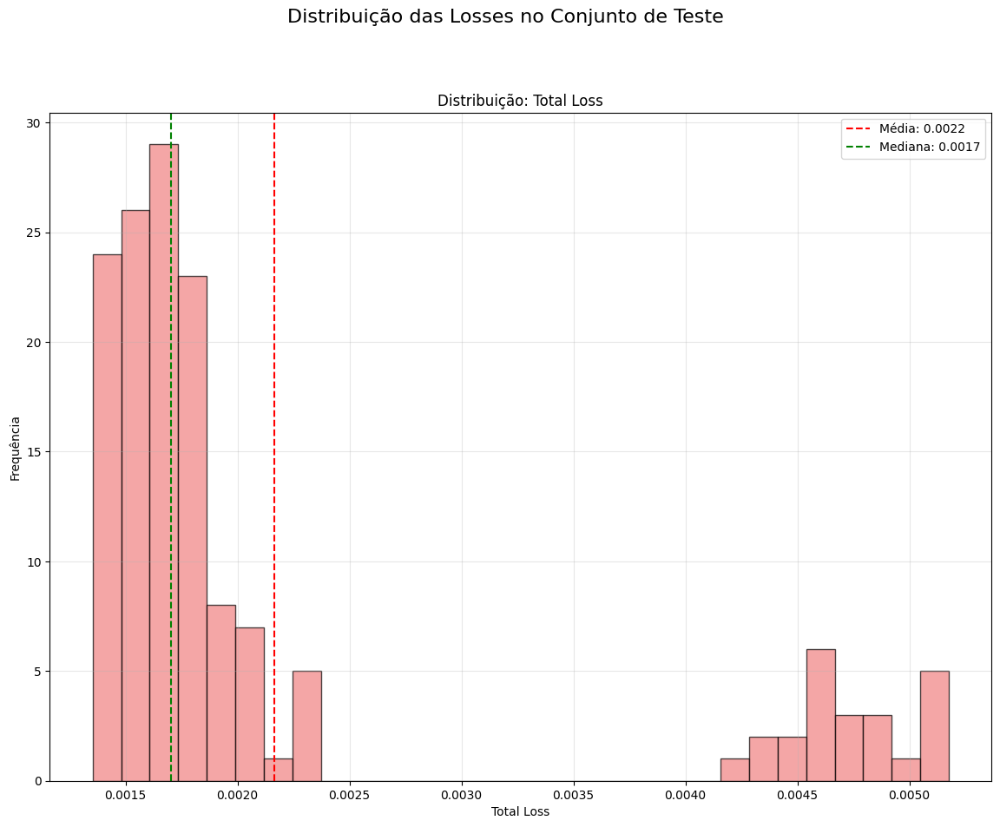

✓ Gráfico salvo: ..\..\figs\posenet\fold1\keypoint_analysis.png


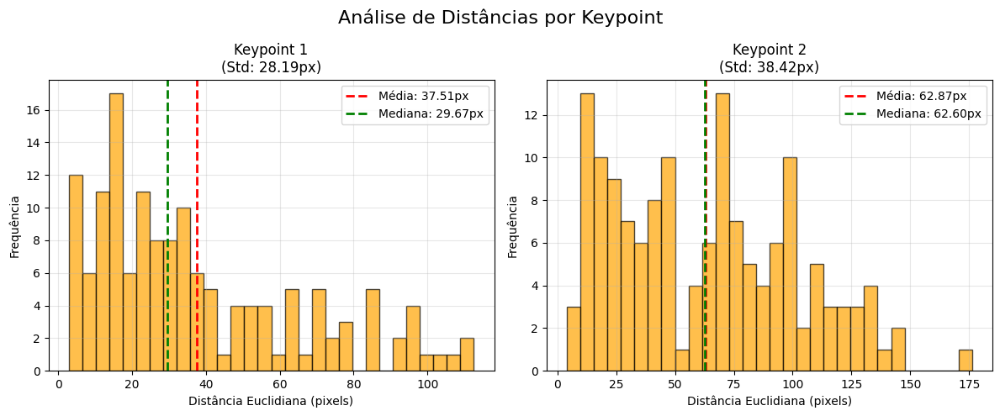


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\posenet\fold1\predictions_by_distance_keypoint1.png


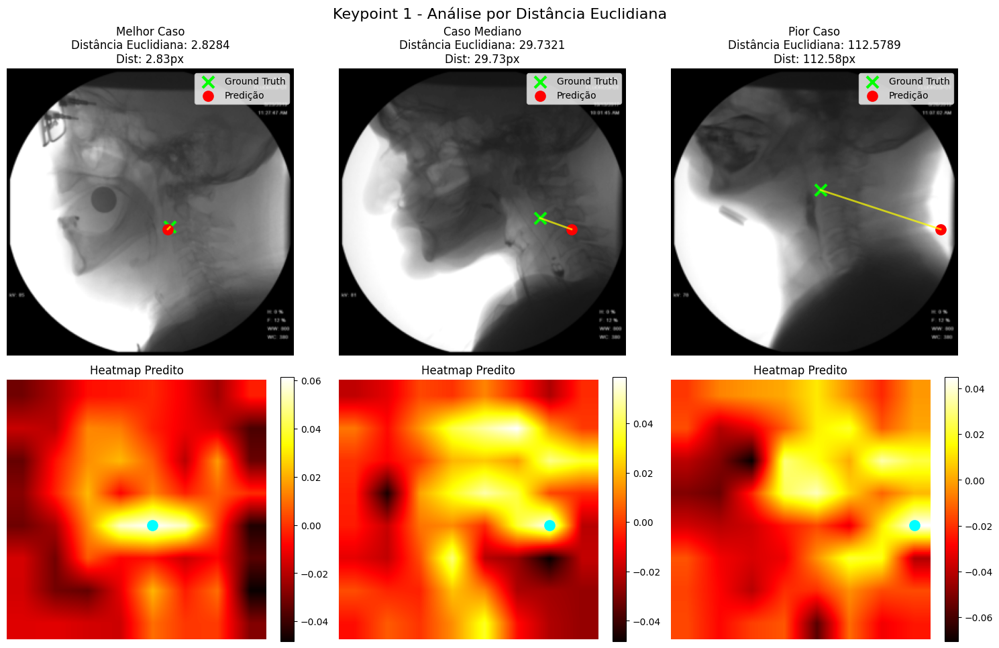


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\posenet\fold1\predictions_by_distance_keypoint2.png


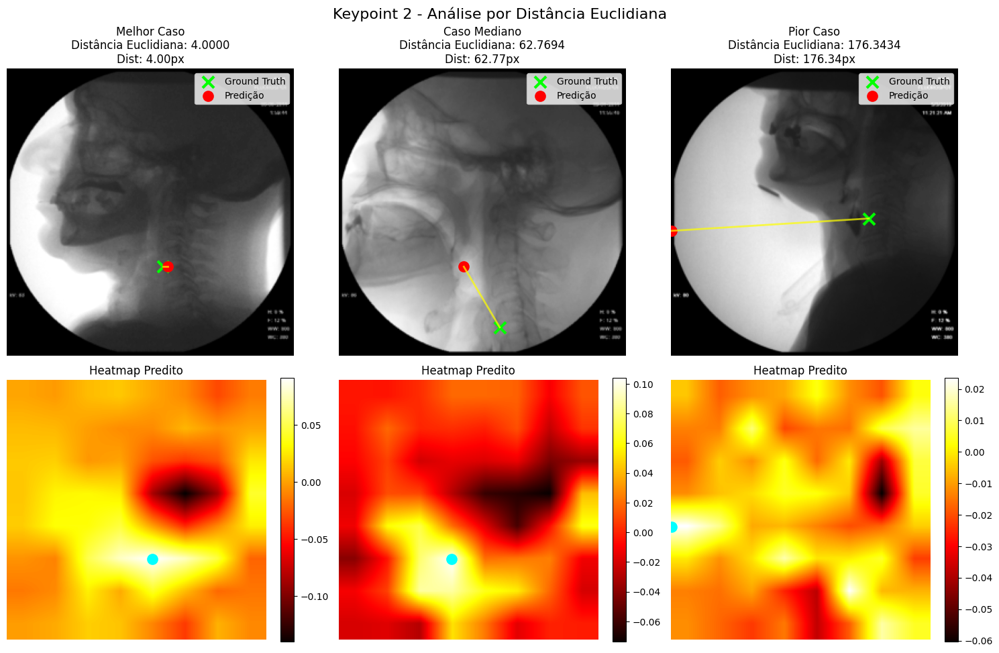


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\posenet\fold1\predictions_by_loss_keypoint1.png


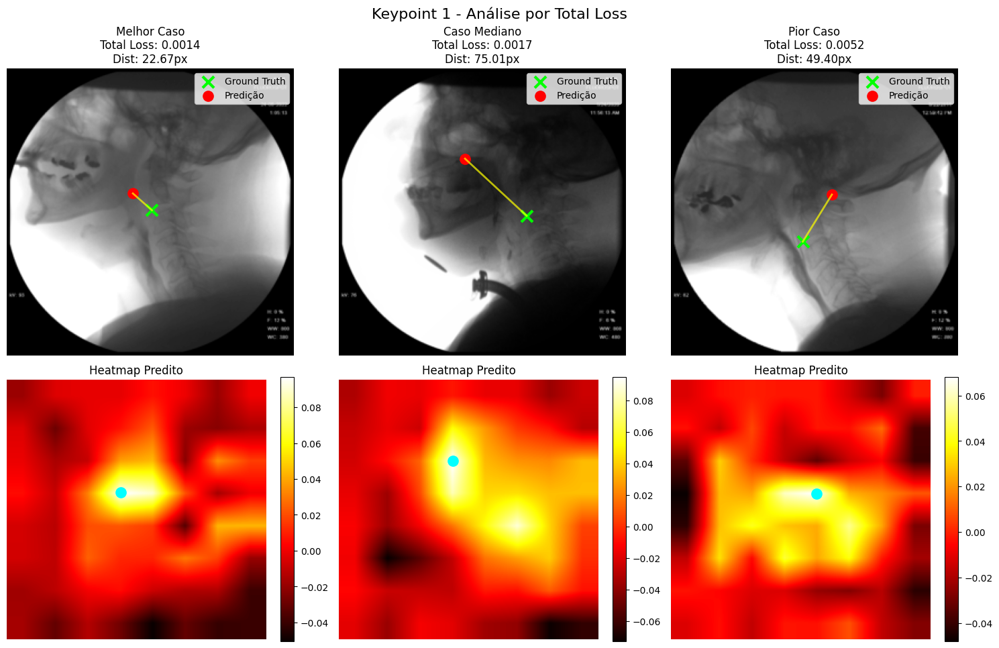


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\posenet\fold1\predictions_by_loss_keypoint2.png


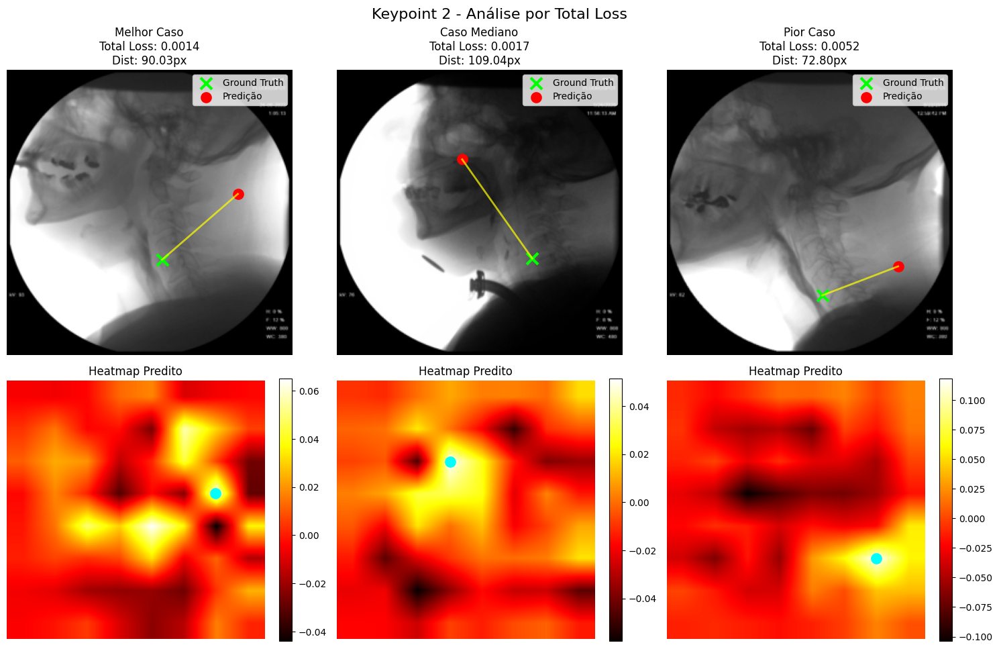

RELATÓRIO DE AVALIAÇÃO NO CONJUNTO DE TESTE

Número de amostras: 146

----------------------------------------------------------------------
LOSS TOTAL
----------------------------------------------------------------------
Média:    0.002164
Mediana:  0.001702
Std:      0.001134
Min:      0.001353
Max:      0.005176

----------------------------------------------------------------------
KEYPOINT 1 - DISTÂNCIA EUCLIDIANA (pixels)
----------------------------------------------------------------------
Média:    37.51
Mediana:  29.67
Std:      28.19
Min:      2.83
Max:      112.58
Quartis:  Q1=15.33, Q3=54.47

----------------------------------------------------------------------
KEYPOINT 2 - DISTÂNCIA EUCLIDIANA (pixels)
----------------------------------------------------------------------
Média:    62.87
Mediana:  62.60
Std:      38.42
Min:      4.00
Max:      176.34
Quartis:  Q1=28.88, Q3=92.36


✓ Relatório salvo: ..\..\figs\posenet\fold1\evaluation_report.txt

AVALIAÇÃO CONCLUÍDA!
Re

Avaliando: 100%|██████████| 146/146 [00:24<00:00,  6.05it/s]



GERANDO VISUALIZAÇÕES
✓ Gráfico salvo: ..\..\figs\posenet\fold2\loss_distributions.png


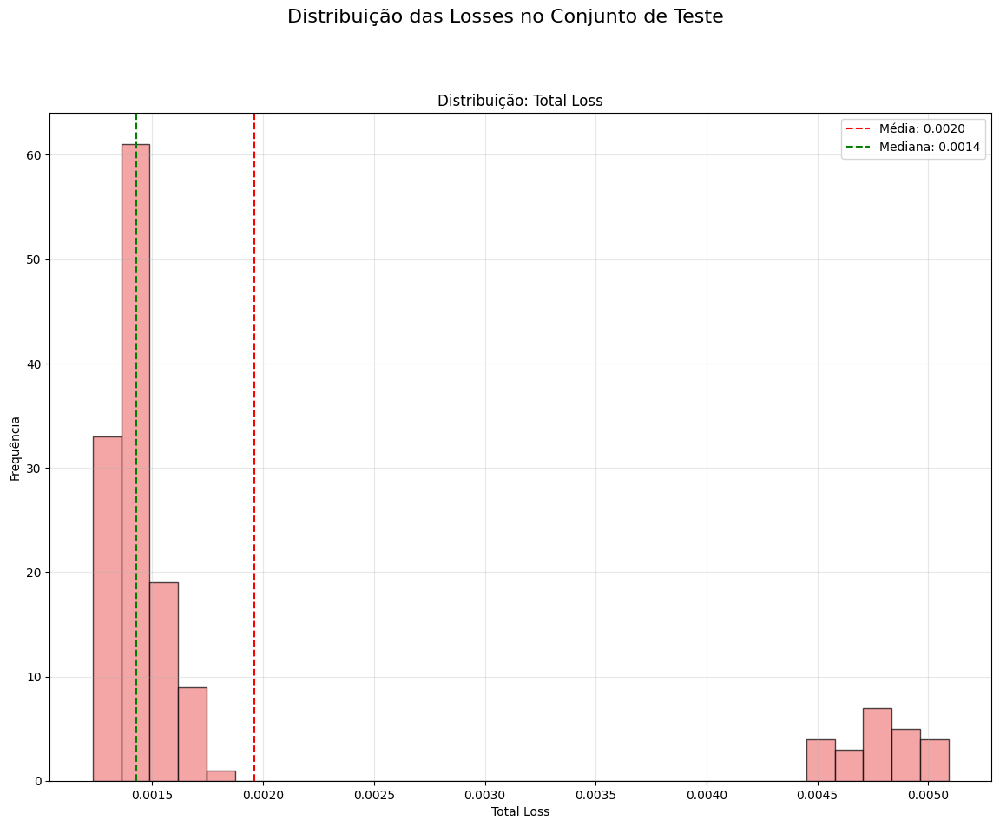

✓ Gráfico salvo: ..\..\figs\posenet\fold2\keypoint_analysis.png


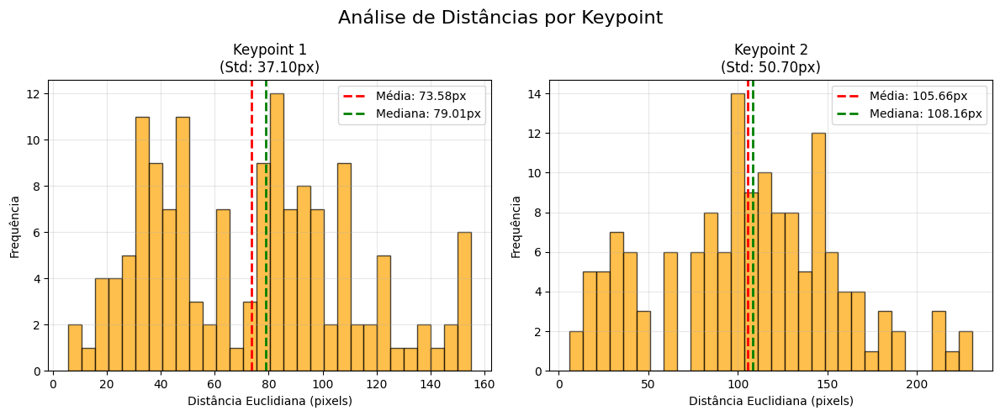


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\posenet\fold2\predictions_by_distance_keypoint1.png


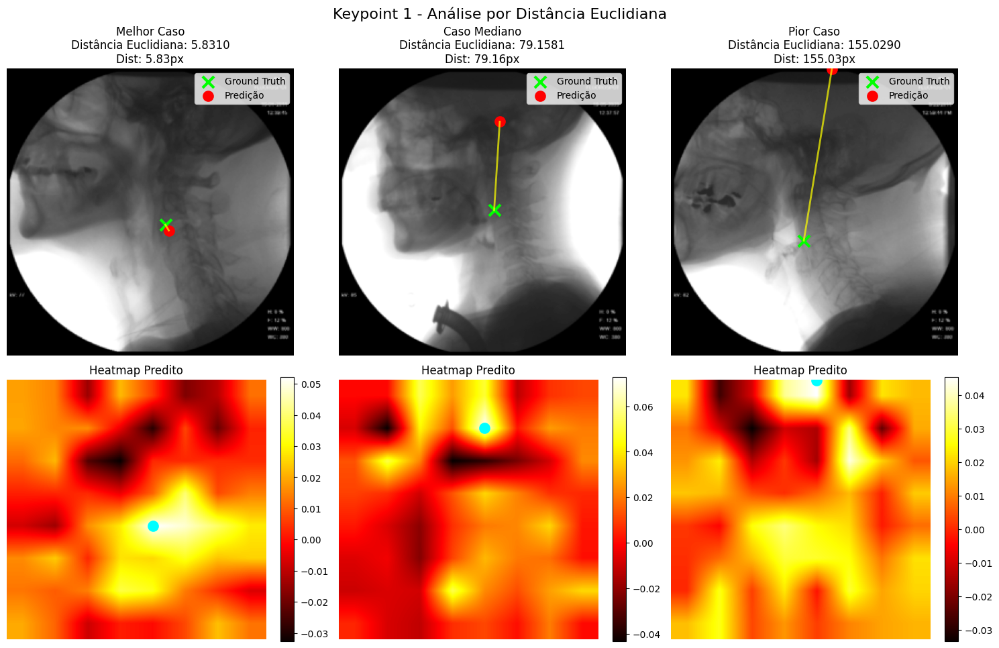


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\posenet\fold2\predictions_by_distance_keypoint2.png


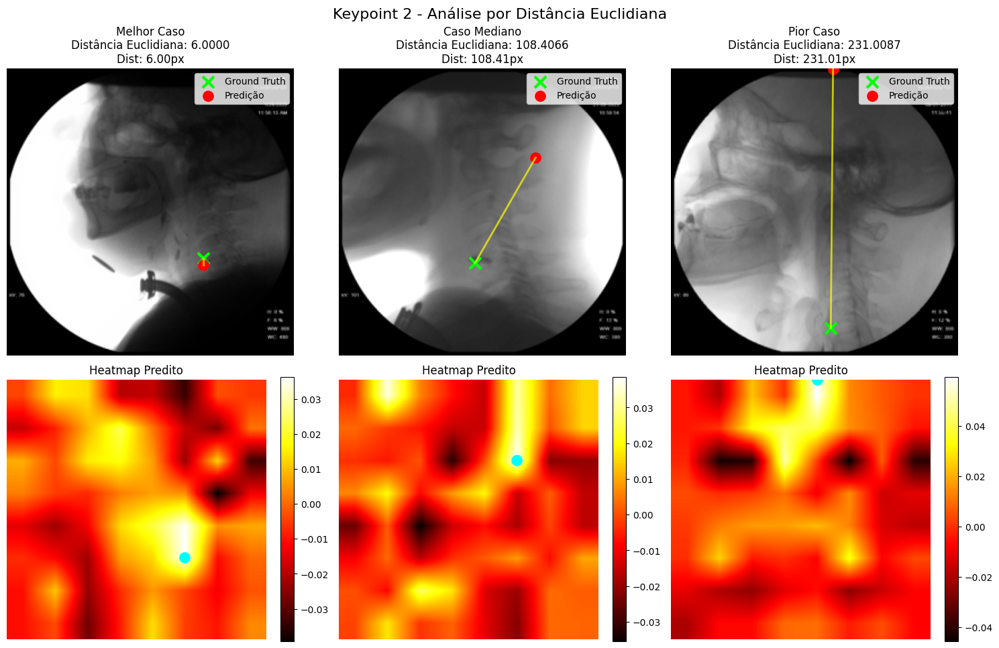


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\posenet\fold2\predictions_by_loss_keypoint1.png


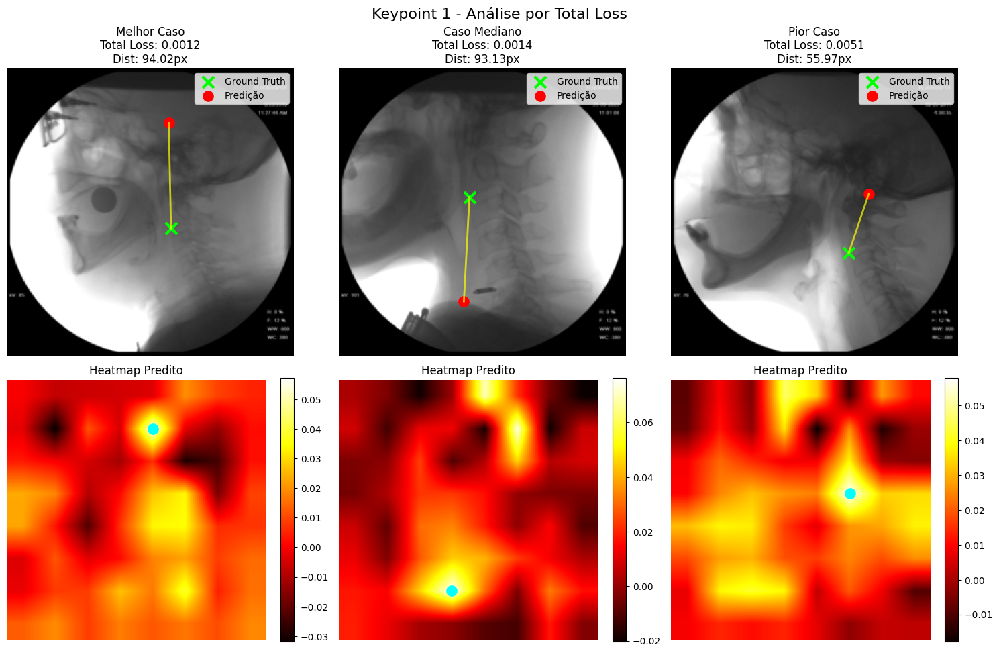


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\posenet\fold2\predictions_by_loss_keypoint2.png


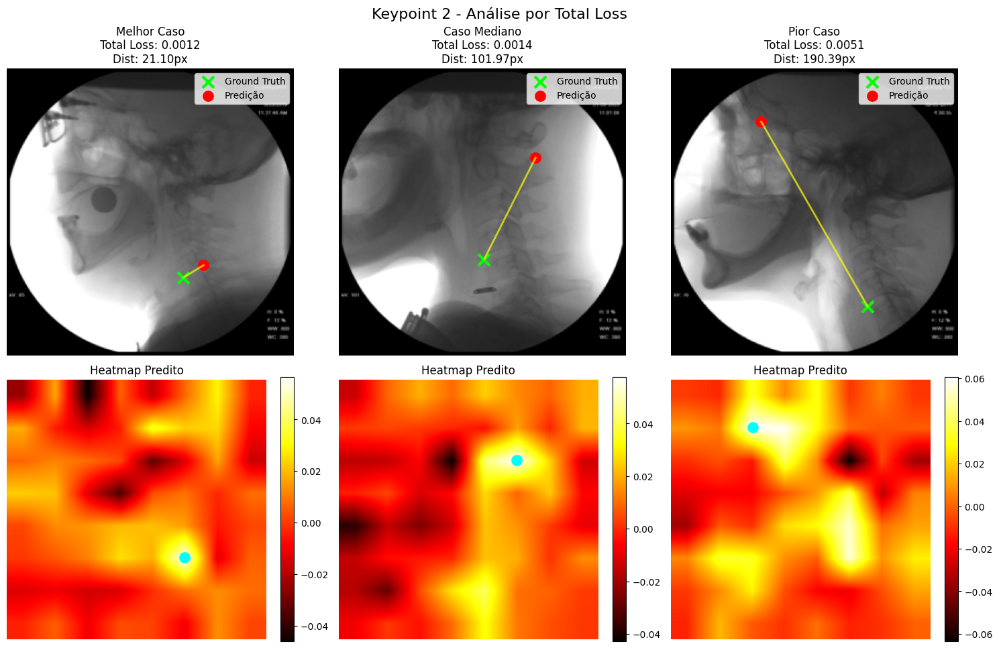

RELATÓRIO DE AVALIAÇÃO NO CONJUNTO DE TESTE

Número de amostras: 146

----------------------------------------------------------------------
LOSS TOTAL
----------------------------------------------------------------------
Média:    0.001961
Mediana:  0.001427
Std:      0.001232
Min:      0.001231
Max:      0.005093

----------------------------------------------------------------------
KEYPOINT 1 - DISTÂNCIA EUCLIDIANA (pixels)
----------------------------------------------------------------------
Média:    73.58
Mediana:  79.01
Std:      37.10
Min:      5.83
Max:      155.03
Quartis:  Q1=40.97, Q3=97.16

----------------------------------------------------------------------
KEYPOINT 2 - DISTÂNCIA EUCLIDIANA (pixels)
----------------------------------------------------------------------
Média:    105.66
Mediana:  108.16
Std:      50.70
Min:      6.00
Max:      231.01
Quartis:  Q1=74.55, Q3=141.92


✓ Relatório salvo: ..\..\figs\posenet\fold2\evaluation_report.txt

AVALIAÇÃO CONCLUÍDA!

Avaliando: 100%|██████████| 146/146 [00:23<00:00,  6.25it/s]



GERANDO VISUALIZAÇÕES
✓ Gráfico salvo: ..\..\figs\posenet\fold3\loss_distributions.png


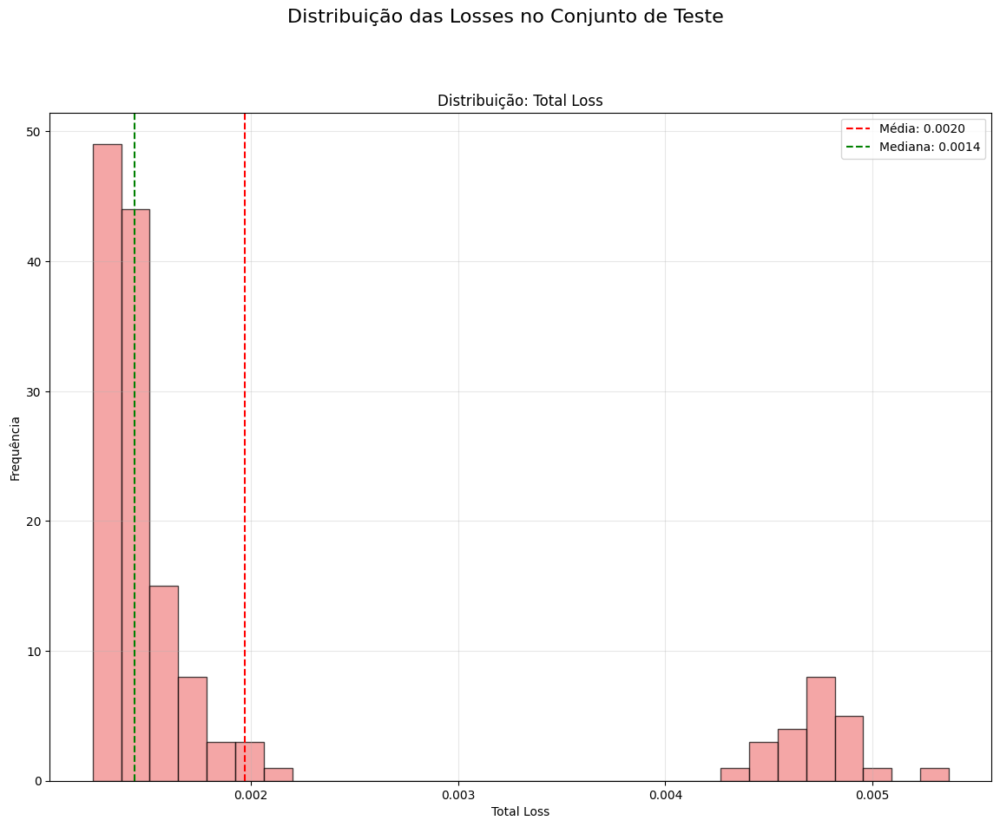

✓ Gráfico salvo: ..\..\figs\posenet\fold3\keypoint_analysis.png


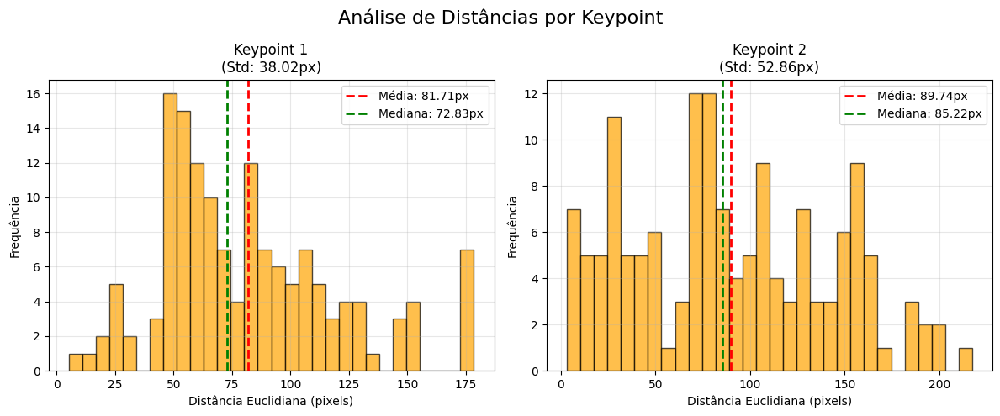


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\posenet\fold3\predictions_by_distance_keypoint1.png


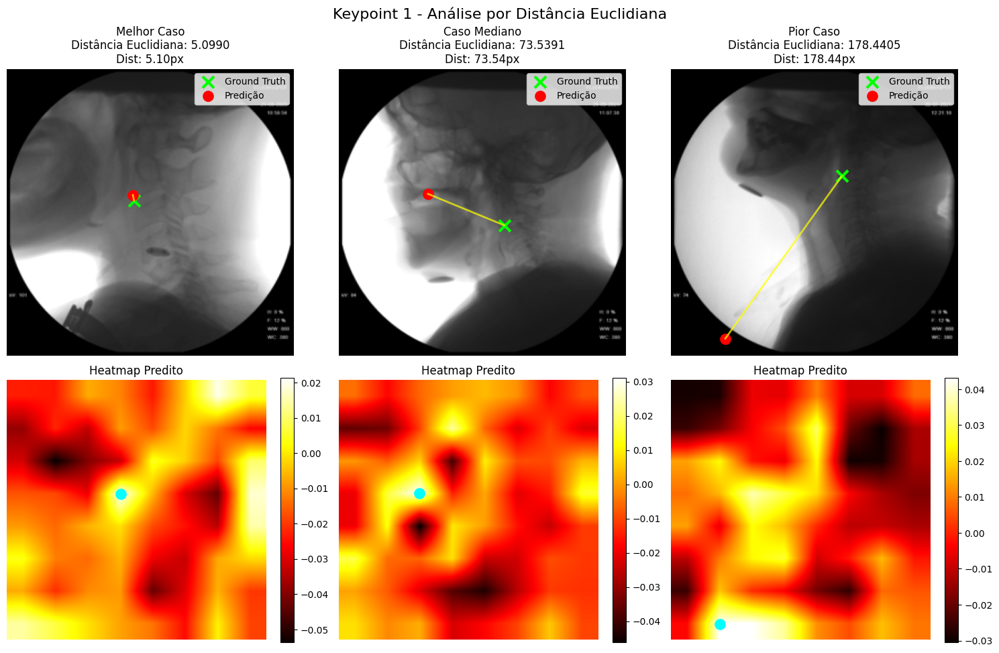


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\posenet\fold3\predictions_by_distance_keypoint2.png


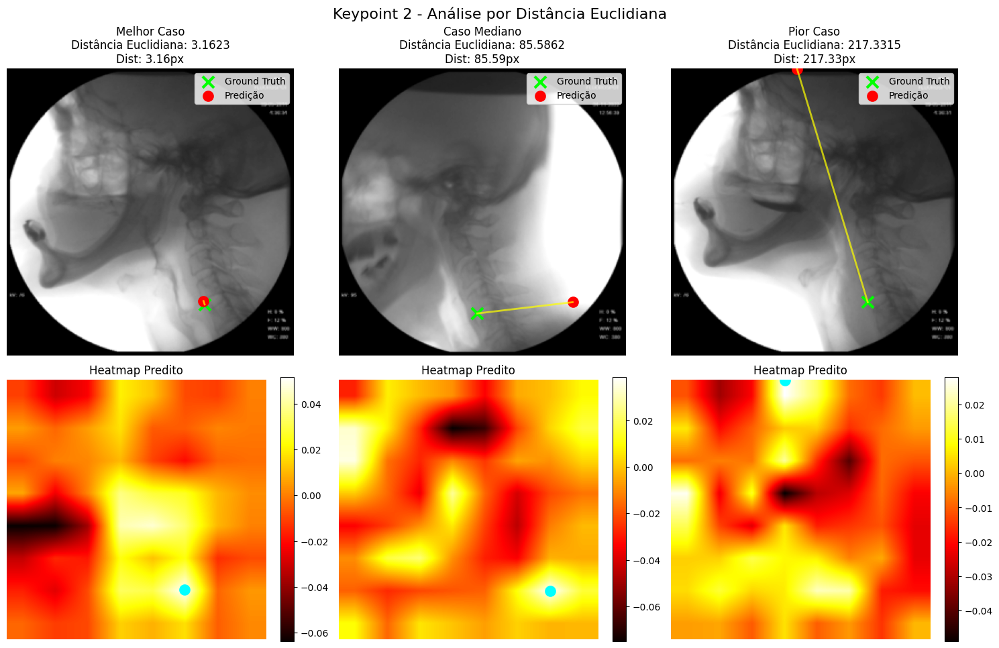


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\posenet\fold3\predictions_by_loss_keypoint1.png


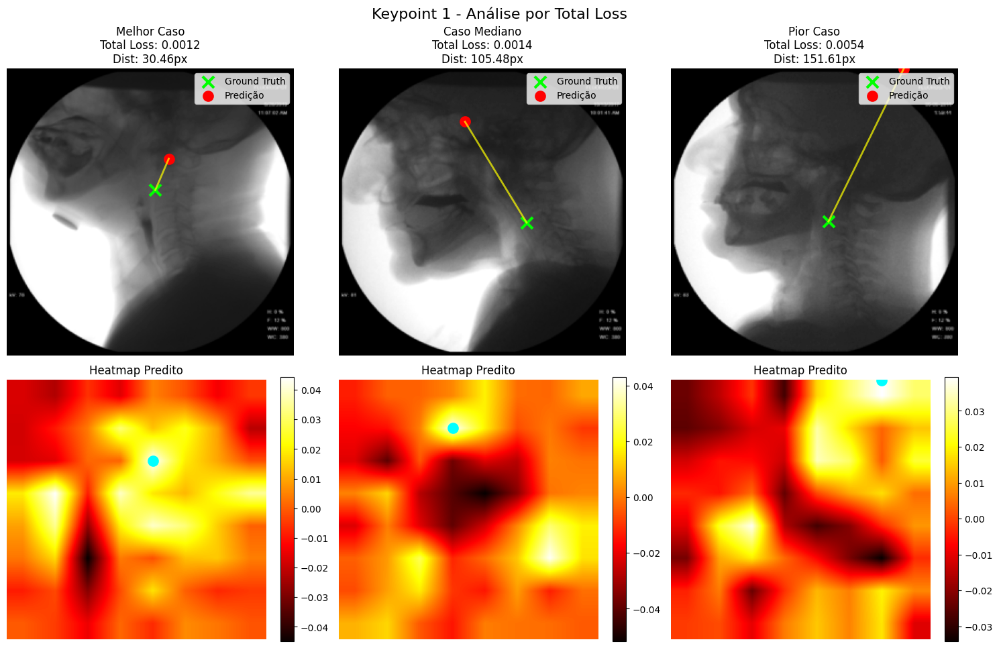


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\posenet\fold3\predictions_by_loss_keypoint2.png


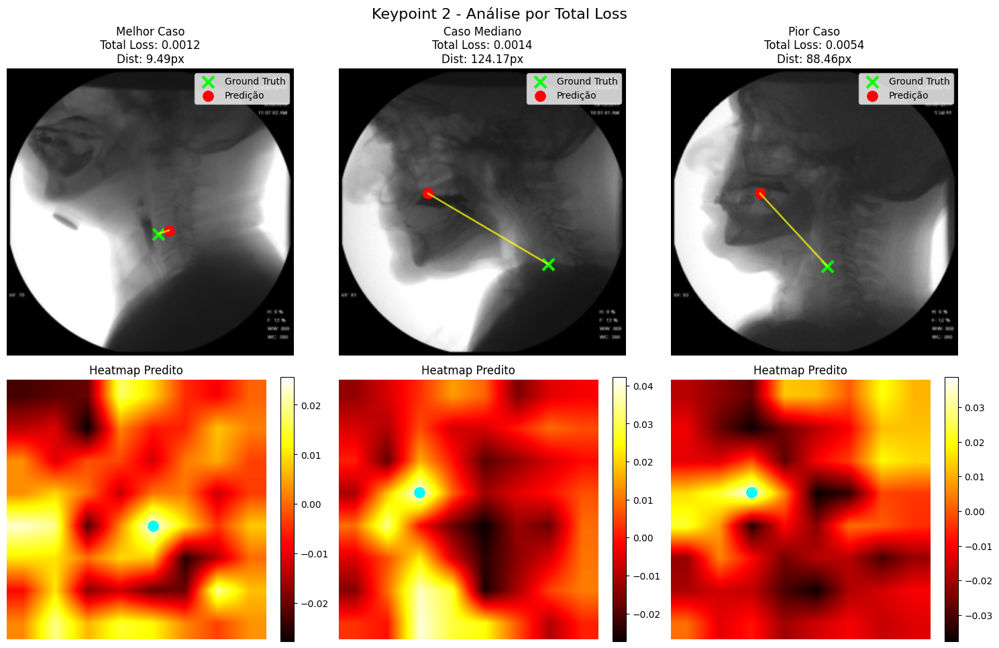

RELATÓRIO DE AVALIAÇÃO NO CONJUNTO DE TESTE

Número de amostras: 146

----------------------------------------------------------------------
LOSS TOTAL
----------------------------------------------------------------------
Média:    0.001971
Mediana:  0.001441
Std:      0.001206
Min:      0.001238
Max:      0.005368

----------------------------------------------------------------------
KEYPOINT 1 - DISTÂNCIA EUCLIDIANA (pixels)
----------------------------------------------------------------------
Média:    81.71
Mediana:  72.83
Std:      38.02
Min:      5.10
Max:      178.44
Quartis:  Q1=54.52, Q3=105.36

----------------------------------------------------------------------
KEYPOINT 2 - DISTÂNCIA EUCLIDIANA (pixels)
----------------------------------------------------------------------
Média:    89.74
Mediana:  85.22
Std:      52.86
Min:      3.16
Max:      217.33
Quartis:  Q1=41.48, Q3=128.87


✓ Relatório salvo: ..\..\figs\posenet\fold3\evaluation_report.txt

AVALIAÇÃO CONCLUÍDA!


Avaliando: 100%|██████████| 146/146 [00:24<00:00,  6.07it/s]



GERANDO VISUALIZAÇÕES
✓ Gráfico salvo: ..\..\figs\posenet\fold4\loss_distributions.png


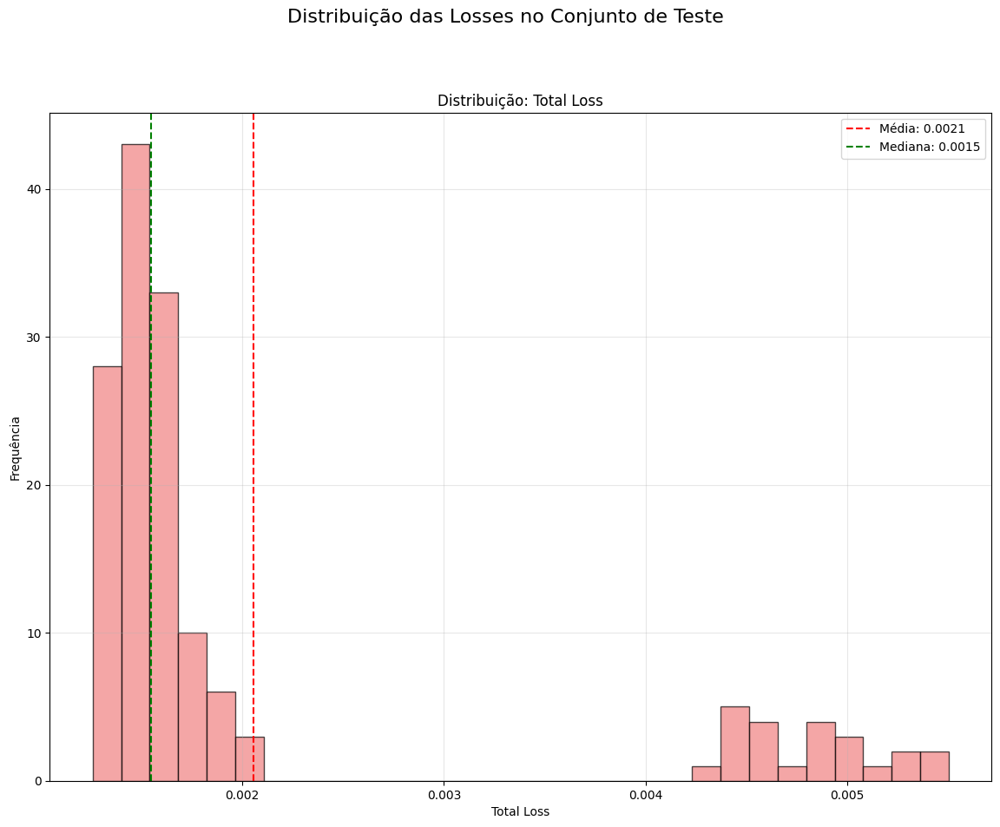

✓ Gráfico salvo: ..\..\figs\posenet\fold4\keypoint_analysis.png


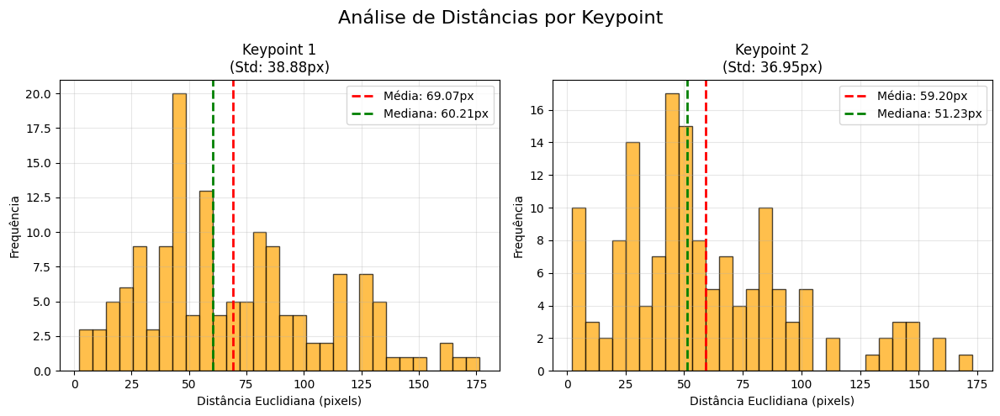


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\posenet\fold4\predictions_by_distance_keypoint1.png


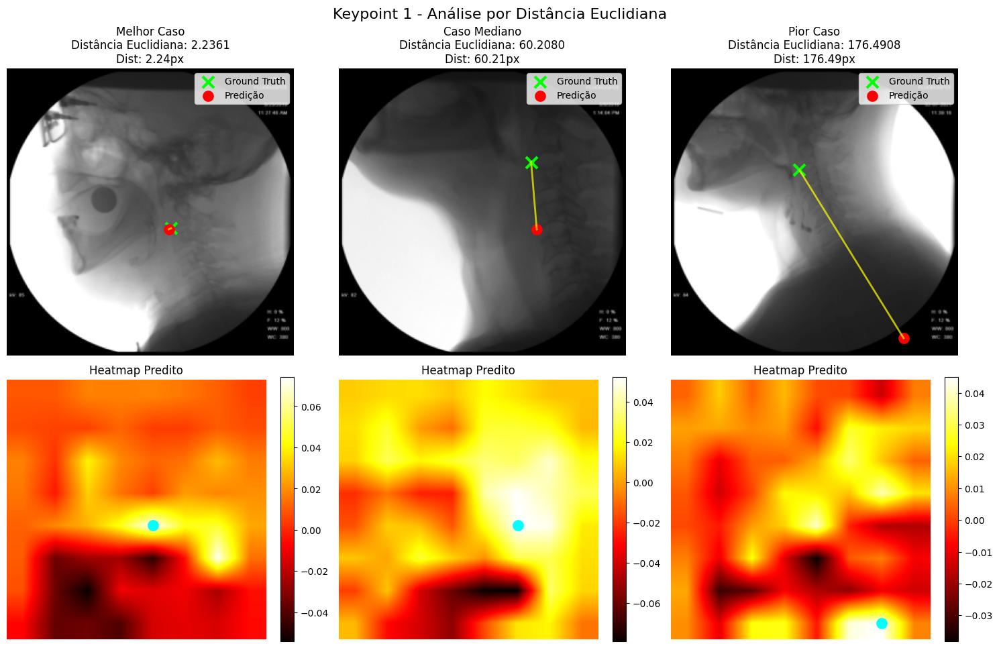


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\posenet\fold4\predictions_by_distance_keypoint2.png


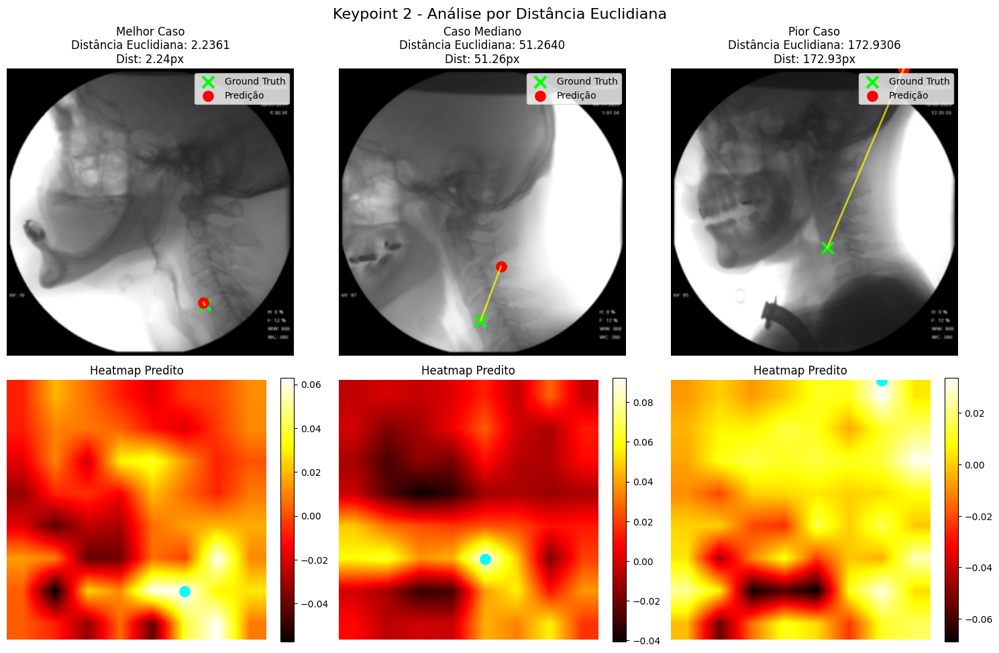


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\posenet\fold4\predictions_by_loss_keypoint1.png


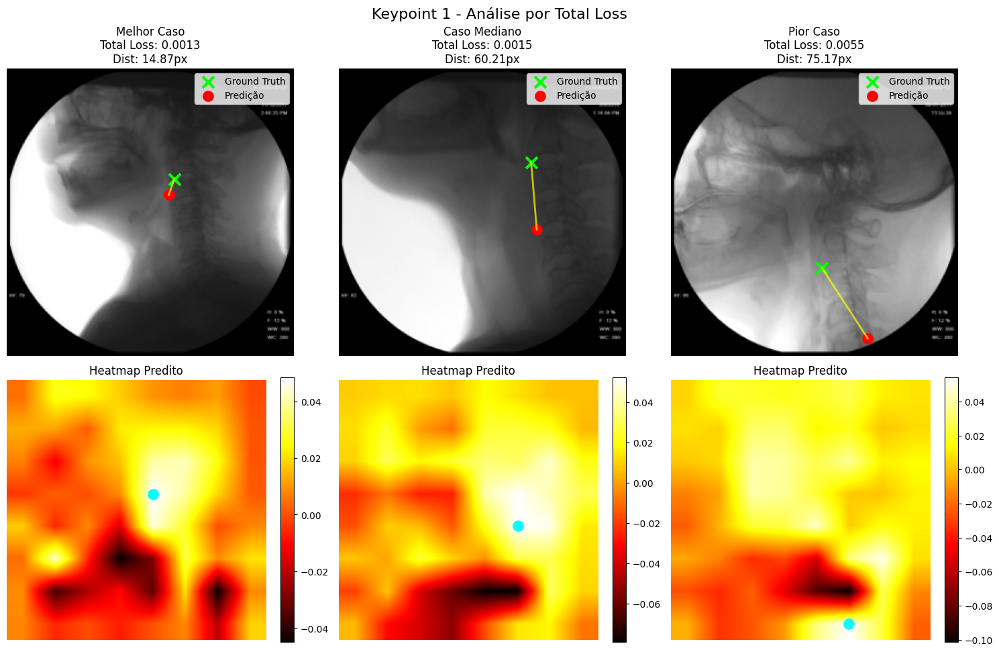


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\posenet\fold4\predictions_by_loss_keypoint2.png


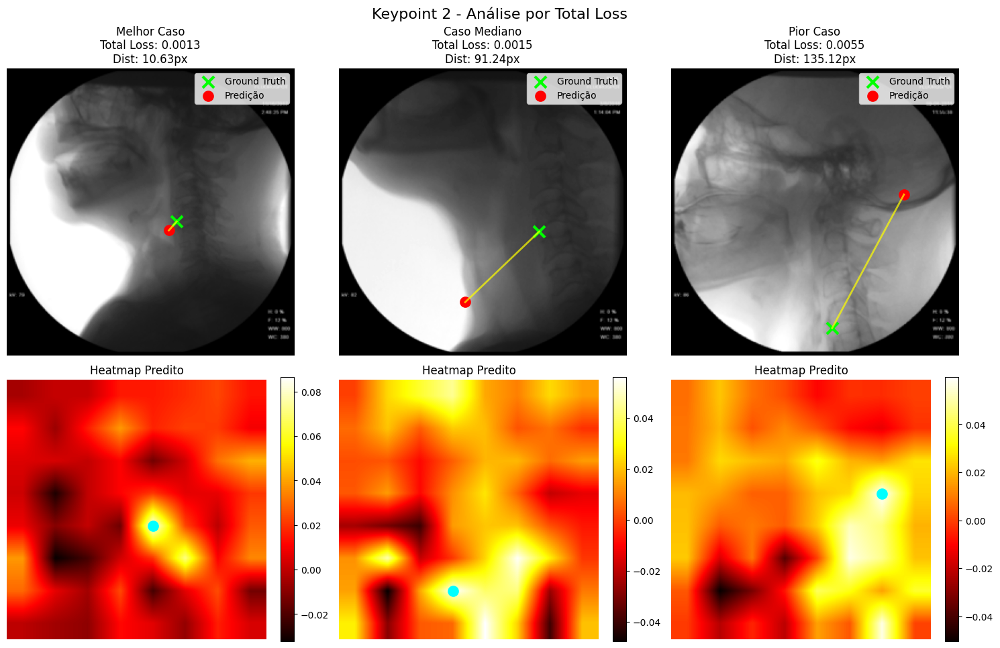

RELATÓRIO DE AVALIAÇÃO NO CONJUNTO DE TESTE

Número de amostras: 146

----------------------------------------------------------------------
LOSS TOTAL
----------------------------------------------------------------------
Média:    0.002054
Mediana:  0.001549
Std:      0.001216
Min:      0.001258
Max:      0.005503

----------------------------------------------------------------------
KEYPOINT 1 - DISTÂNCIA EUCLIDIANA (pixels)
----------------------------------------------------------------------
Média:    69.07
Mediana:  60.21
Std:      38.88
Min:      2.24
Max:      176.49
Quartis:  Q1=40.61, Q3=90.52

----------------------------------------------------------------------
KEYPOINT 2 - DISTÂNCIA EUCLIDIANA (pixels)
----------------------------------------------------------------------
Média:    59.20
Mediana:  51.23
Std:      36.95
Min:      2.24
Max:      172.93
Quartis:  Q1=30.85, Q3=82.07


✓ Relatório salvo: ..\..\figs\posenet\fold4\evaluation_report.txt

AVALIAÇÃO CONCLUÍDA!
Re

Avaliando: 100%|██████████| 146/146 [00:23<00:00,  6.18it/s]



GERANDO VISUALIZAÇÕES
✓ Gráfico salvo: ..\..\figs\posenet\fold5\loss_distributions.png


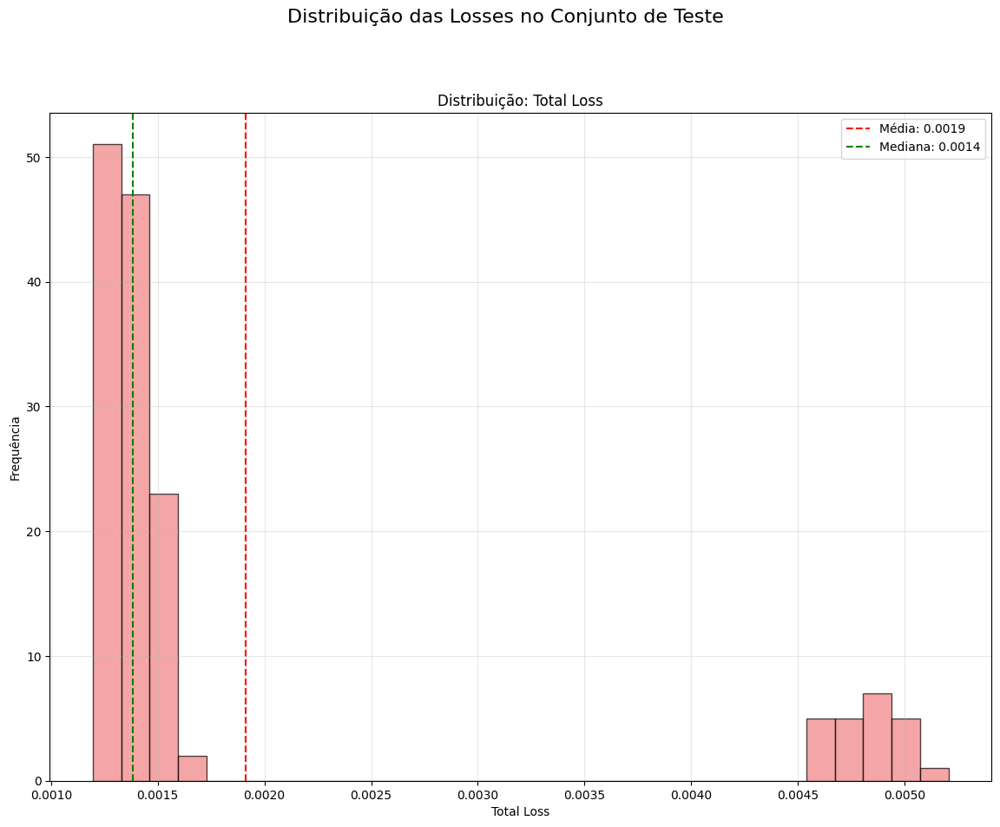

✓ Gráfico salvo: ..\..\figs\posenet\fold5\keypoint_analysis.png


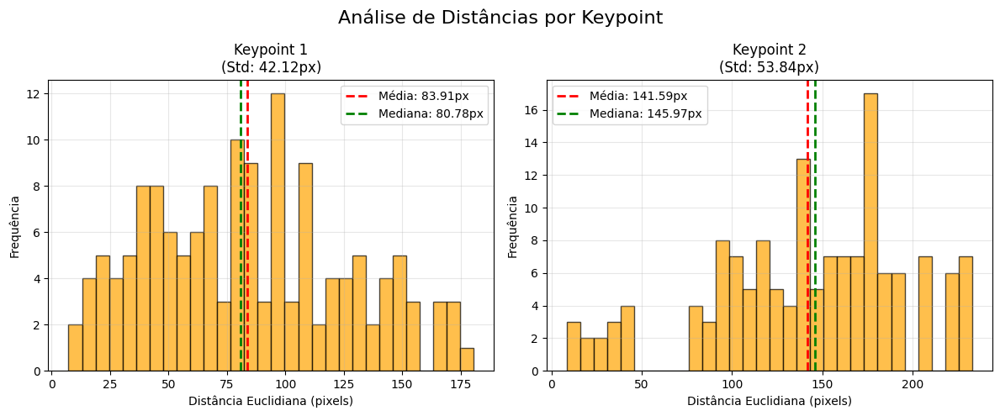


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\posenet\fold5\predictions_by_distance_keypoint1.png


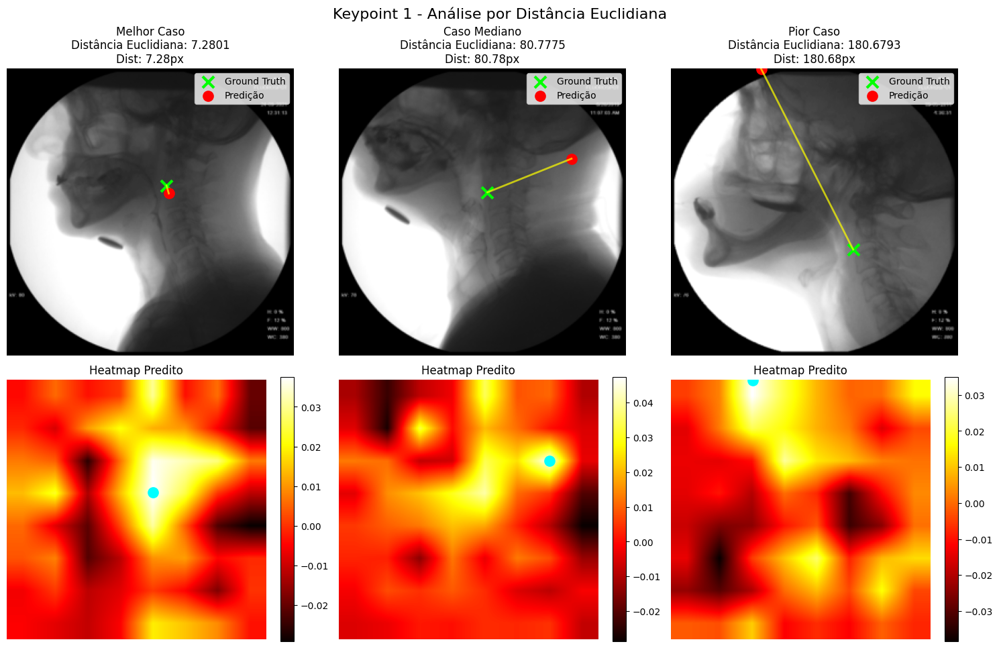


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\posenet\fold5\predictions_by_distance_keypoint2.png


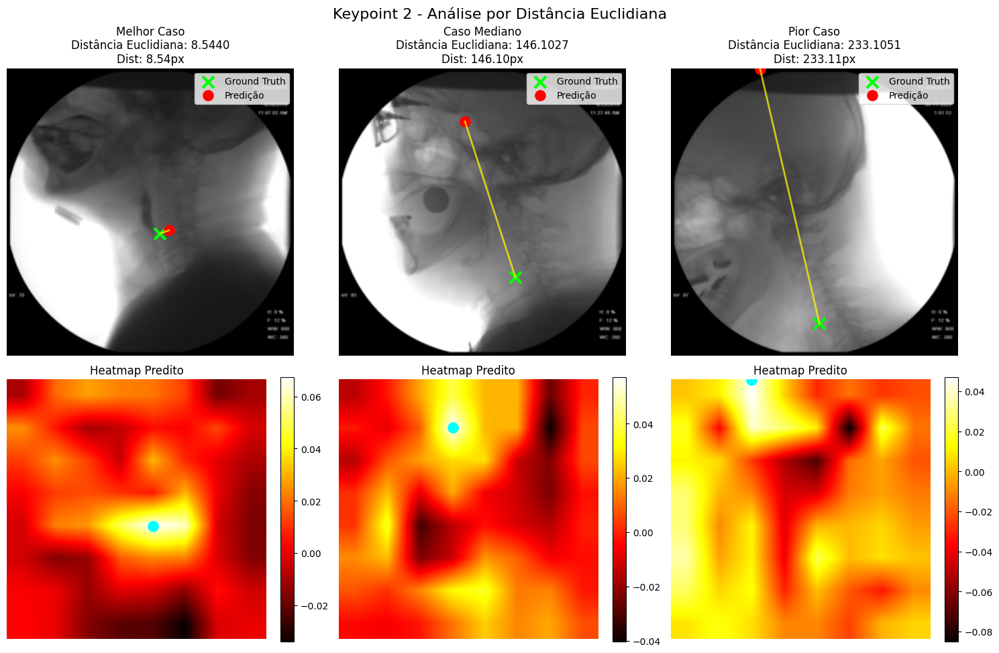


--- Visualizações para Keypoint 1 ---
✓ Figura salva: ..\..\figs\posenet\fold5\predictions_by_loss_keypoint1.png


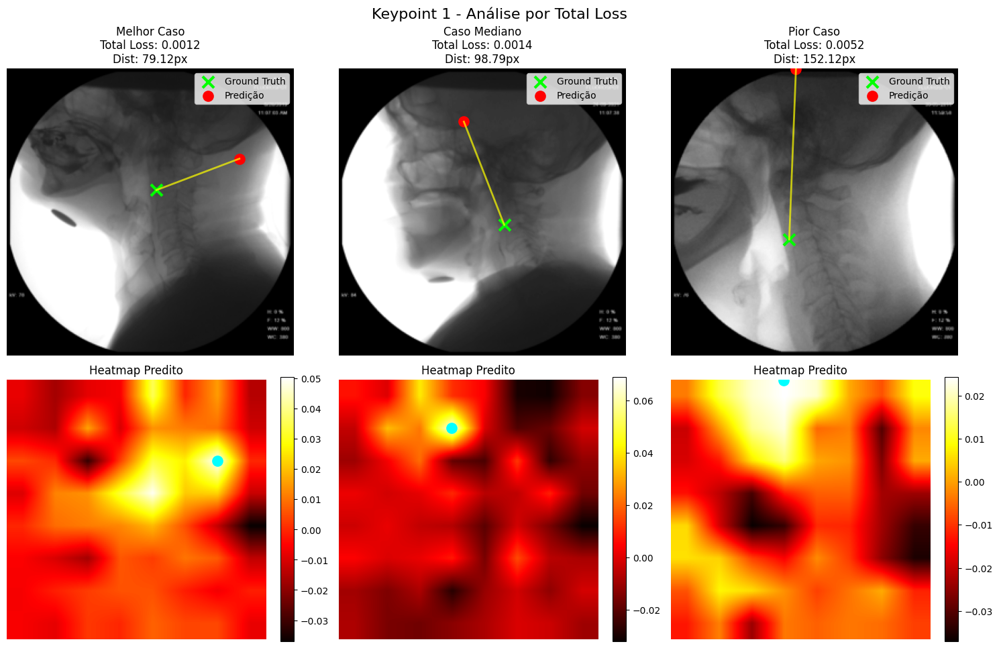


--- Visualizações para Keypoint 2 ---
✓ Figura salva: ..\..\figs\posenet\fold5\predictions_by_loss_keypoint2.png


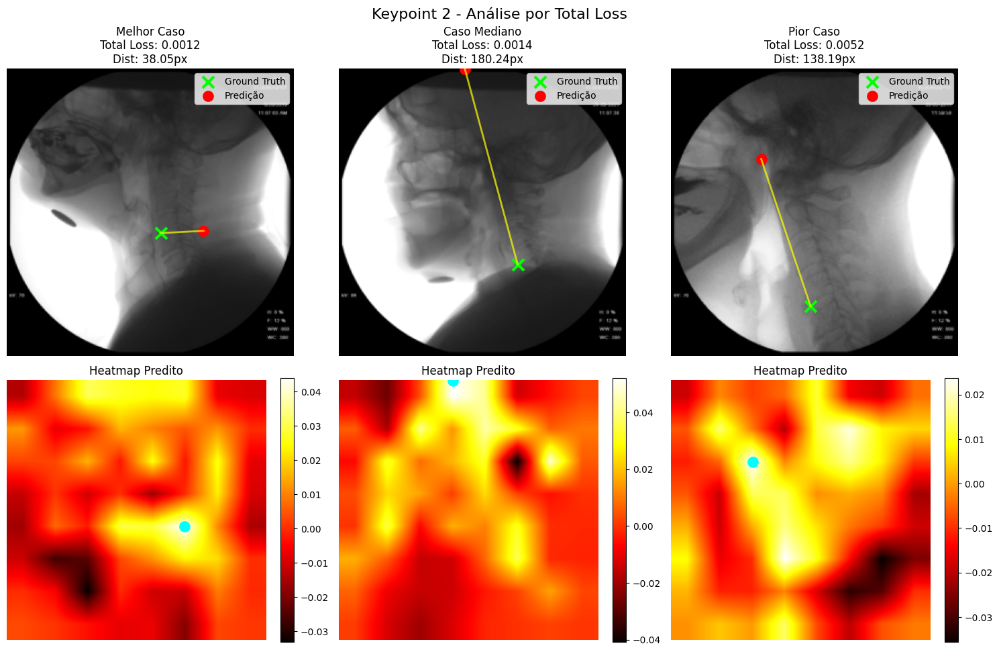

RELATÓRIO DE AVALIAÇÃO NO CONJUNTO DE TESTE

Número de amostras: 146

----------------------------------------------------------------------
LOSS TOTAL
----------------------------------------------------------------------
Média:    0.001912
Mediana:  0.001385
Std:      0.001266
Min:      0.001195
Max:      0.005207

----------------------------------------------------------------------
KEYPOINT 1 - DISTÂNCIA EUCLIDIANA (pixels)
----------------------------------------------------------------------
Média:    83.91
Mediana:  80.78
Std:      42.12
Min:      7.28
Max:      180.68
Quartis:  Q1=48.38, Q3=109.45

----------------------------------------------------------------------
KEYPOINT 2 - DISTÂNCIA EUCLIDIANA (pixels)
----------------------------------------------------------------------
Média:    141.59
Mediana:  145.97
Std:      53.84
Min:      8.54
Max:      233.11
Quartis:  Q1=107.89, Q3=177.66


✓ Relatório salvo: ..\..\figs\posenet\fold5\evaluation_report.txt

AVALIAÇÃO CONCLUÍD

In [ ]:
# APLICAÇÃO - TESTE
# ============================================================================

for fold_idx in range(len(list_df_folds)):

    # Carrega melhor modelo do fold 1
    checkpoint_path = f"..\\..\\data\\model_weights\\posenet_tunning\\fold_{fold_idx+1}_best.pth"
    
    # Cria dataset de teste
    test_dataset = VFSSImageDataset(
        video_frame_df=df_test,
        target="heatmap+roi+points",
        output_dim=(256, 256),
        sigma = 20
    )
    
    model_kwargs = {
        "num_keypoints": 2,
    }

    # Executa avaliação completa
    results = evaluate_model_on_test(
        model_class=PoseNet,
        model_kwargs=model_kwargs,
        checkpoint_path=checkpoint_path,
        test_dataset=test_dataset,
        config=config,
        modify_input_fn=modify_input,
        output_dir=f"..\\..\\figs\\posenet\\fold{fold_idx+1}"
    )
    